# Lab2_MIA_BME_23_24_Group11

Medical Image Analysis: Lab 2

Group 11:
- Enrique Almazán Sánchez
- Guillermo Ots Rodríguez
- Javier Villoldo Fernández

## Objectives

The goal of this Laboratory is to become familiar with the different basic methods of segmentation for medical images that have been covered in class and to gain a deeper understanding of their underlying operation. In particular, **thresholding**, **region growing** and **watershed algorithms** will be implemented.

Moreover, more advanced segmentation algorithms such as contour tracking as well as others in the available in the state-of-the-art of the field will be explored, thus, increasing our understanding of the available techniques and their applicability to medical image processing.

- Enrique Almazán Sánchez: **Thresholding, Region Growing and Active Contours (Brain MRI) and** "advanced segmentation method (brain MRI and cardiac)".
- Guillermo Ots Rodríguez: **Watershed algorithm implementation (brain MRI transverse section and cardiac MRI transverse section)**.
- Javier Villoldo Fernández: **Thresholding, Region Growing (cardiac MRI) and Active Contours (Cardiac MRI and Brain MRI)**.

We will apply these algorithms to real clinical images to assess their effectiveness, evaluating the results assesing how well the algorithms achieve their intended goals, which are segmenting the desired Regions of Interest (ROIs) of the proposed images.

Additionally, not only will the results of the implemented techniques be compared with each other but also with a supplementary image with different characteristics.

## Dependencies (required libraries)
The required denpendencies or libraries for this project are the following ones:

- **NumPy (Numerical Python)**: fundamental library for numerical computing in Python. It provides support for large, multi-dimensional arrays and matrices, along with a wide range of mathematical functions to operate on these arrays efficiently.

- **matplotlib.pyplot (Matplotlib's Pyplot Module)**: powerful library for creating static, animated, or interactive visualizations in Python. The pyplot module provides a simple and MATLAB-like interface for creating plots and charts.


- **OpenCV (cv2)**: OpenCV (Open Source Computer Vision Library) is a library dedicated to computer vision and image processing tasks. It offers a wide range of functions for image analysis, including image filtering, object detection and feature extractiona.


- **scikit-image (skimage)**: an image processing library built on top of SciPy and NumPy. It provides tools and algorithms for a wide range of image processing tasks, making it useful for tasks such as feature extraction and image enhancement.


- **SciPy**: a scientific library that builds on NumPy and provides additional functionality for scientific and technical computing. It includes tools for optimization, signal processing, statistical analysis, and more.


### Imports

Maybe some dependencies, such as OpenCV, should be installed before running the code, with the command:
            
            pip install 'dependency_to_be_installed'.

In [1]:
import numpy as np
import random
import matplotlib.pyplot as plt

import cv2 as cv

from skimage import io
from skimage.util import random_noise, img_as_float
from skimage import data, filters, color, morphology
from skimage.exposure import histogram
from skimage.filters import threshold_otsu as otsu
from skimage.segmentation import flood_fill, active_contour, felzenszwalb, mark_boundaries
from skimage.draw import polygon

from scipy import ndimage

from skimage.filters import gaussian

from skimage import data, filters, color, morphology
from skimage.segmentation import flood, flood_fill

## Importing image

First of all, we import the images used for the lab practice and show them.

(Text(0.5, 1.0, 'Brain MRI'), (-0.5, 280.5, 312.5, -0.5))

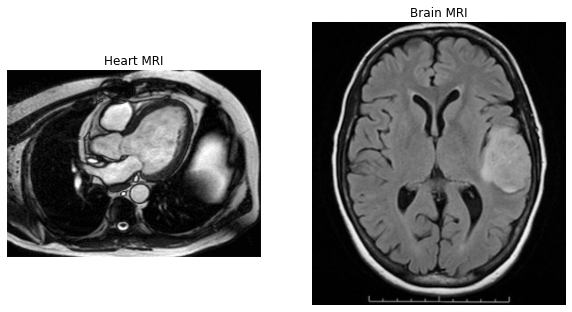

In [2]:
# Load and normalize image
heart = cv.imread('heart_mri.jpeg', cv.IMREAD_GRAYSCALE)
brain = cv.imread('brain_tumor.tif', cv.IMREAD_GRAYSCALE)

# Normalize the image so that algorithms are applied in the same way
#heart = heart/np.max(heart)

# Display results
# Computing the figure
fig = plt.figure(figsize=(10, 10))
# First subplot: Heart MRI image
plt.subplot(1,2,1)
plt.imshow(heart, cmap=plt.cm.gray)
plt.title('Heart MRI'), plt.axis('off')
# Second subplot: Brain MRI image
plt.subplot(1,2,2)
plt.imshow(brain, cmap=plt.cm.gray)
plt.title('Brain MRI'), plt.axis('off')

### Histogram and Cumulative Distribution Function (CDF)

The histogram of each of the images is showed, as it will be an important aspect in the following segmentation techniques. In addition, the Cumulative Distribution Function (CDF), will also be presented, as we will perform later the histogram equalization. The CDF shows how pixel values are distributed throughout the image.

In order to compute both, the histogram and CDF, the following function is used, which will also display them with their image.

In [3]:
def img_hist_cdf(img, size=10):
    """ Display an image, its histogram, and cumulative distribution function (CDF).

    Parameters:
    - img (numpy.ndarray): The input image as a NumPy array.
    - size (int): The size multiplier for the plot's dimensions allowing to control the size of the displayed plot, 
    making it larger or smaller as needed.

    Ouputs:
    - The input image.
    - The histogram of pixel values in the image.
    - The cumulative distribution function (CDF) of pixel values in the image.
    """
    
    # Ensure the input image is valid
    assert img is not None, "The file could not be read. Please check the image file."

    # Computing the histogram and bins of the image
    hist, bins = np.histogram(img.flatten(), 256, [0, 256])

    # Computing the cumulative distribution function (CDF) and normalizing it
    cdf = hist.cumsum()
    cdf_normalized = cdf / cdf.max()

    # Create a single figure with two subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(2 * size, size))

    # Subplot 1: Display the image
    ax1.imshow(img, cmap='gray')
    ax1.set_title('Image')
    ax1.axis('off')

    # Subplot 2: Display the histogram on the left y-axis making sure it extends over all gray levels (bins=256)
    ax2.hist(img.flatten(), 256, [0, 256], label='Histogram')
    ax2.set_xlim([0, 256])
    ax2.set_xlabel('Pixel Value')
    ax2.set_ylabel('Frequency')

    # Create a secondary y-axis on the right for the CDF
    ax3 = ax2.twinx()

    # Plot the CDF on the right y-axis
    ax3.plot(cdf_normalized, color='g', label='CDF')
    ax3.set_ylim([0, 1])
    ax3.set_ylabel('CDF', color='g')

    # Display both legends in the same plot
    lines1, labels1 = ax2.get_legend_handles_labels()
    lines2, labels2 = ax3.get_legend_handles_labels()
    ax2.legend(lines1 + lines2, labels1 + labels2, loc='upper right')

    # Show the combined plot
    plt.show()

Applying the function to each of the images. First to the brain MRI image.

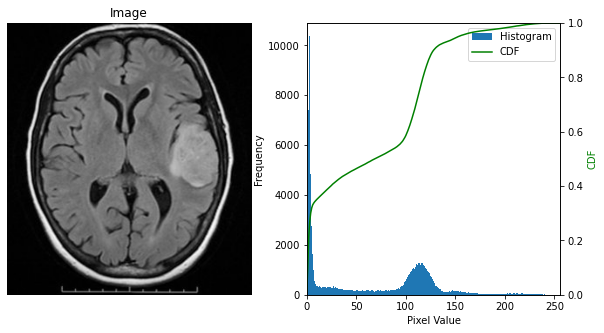

In [4]:
# Histogram and CDF of the Brain MRI image.
img_hist_cdf(brain, size=5)

Secondly to the heart MRI image.

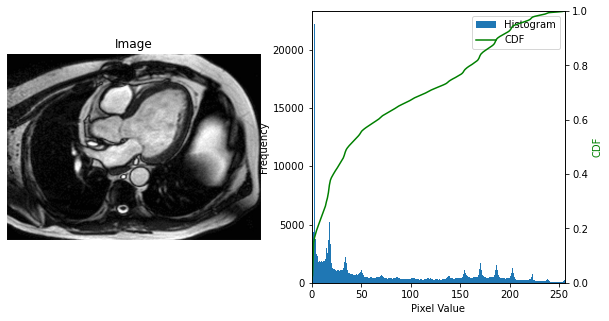

In [5]:
# Histogram and CDF of the Heart MRI image.
img_hist_cdf(heart, size=5)

#### Histogram Equalization

Histogram equalization is an image processing technique used to enhance the contrast and improve the visibility of details in digital images, by redistributing its intensity levels (or gray values) so that they are spread over a wider range. This results in a more balanced distribution of pixel intensities.

It works by computing the cumulative distribution function (CDF) of pixel intensities in the image's histogram and then mapping the pixel values according to this CDF. In simple terms, it stretches the intensity values in such a way that the full range of intensities is utilized.

The primary benefit of histogram equalization is the enhancement of image contrast. It can make details and features in an image more visible and distinguishable. This is particularly useful when dealing with images that have poor contrast or lighting conditions. 

Thus when applying segmentation techniques to images, the results can be influenced by the original image's intensity distribution. If an image has poor contrast or uneven lighting, segmentation algorithms might struggle to distinguish objects or regions effectively so a standardization Intensity Distribution is needed.

However, the images used in this lab practice are already contrast as seen above (the heart MRI more than the brain MRI). Then, why apply it? It has been seen that the background of our images is entirely black, being a high majority of the pixel intensities on the left of the histogram. Then, it will be useful to distribute the gray levels more homogeneously among the entire histogram, by decreasing the peaks and increasing the rest.

Also, by applying histogram equalization to images before subjecting them to segmentation techniques, we standardize the intensity distribution across all images. This ensures that segmentation methods are tested on a level playing field. This is important for fair and meaningful comparisons between different segmentation algorithms.

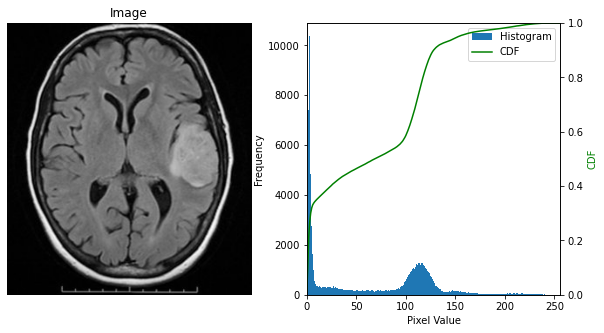

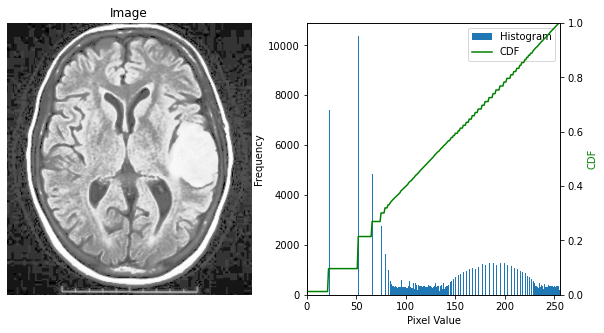

In [6]:
# Apply histogram equalization to the brain MRI
brain_eq = cv.equalizeHist(brain)

img_hist_cdf(brain, size=5)
img_hist_cdf(brain_eq, size=5)

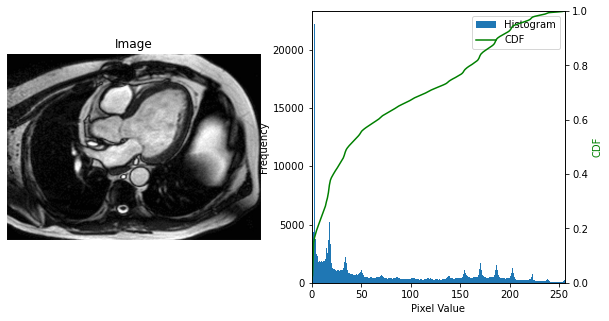

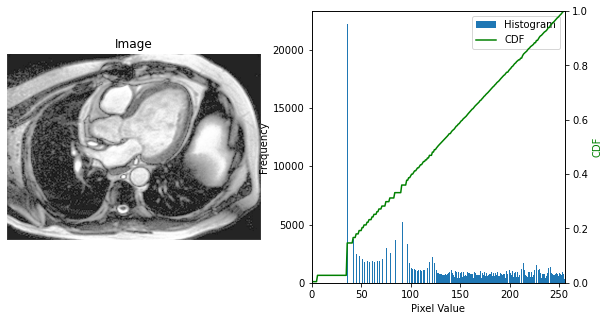

In [7]:
# Apply histogram equalization to the heart MRI
heart_eq = cv.equalizeHist(heart)

img_hist_cdf(heart, size=5)
img_hist_cdf(heart_eq, size=5)

## Thresholding

**Thresholding** is a straightforward image segmentation technique that separates objects or regions in an image based on the pixel intensity. It works by classifying each pixel as part of the foreground (object or region of interest) giving the greater intensity (value 1) or the background (everything else) giving the lower intensity (value 0) using a predefined intensity threshold, having a binary image as a result.

**Advantages of Thresholding:**
- **Simplicity:** Thresholding is the simplest method of segmenting an image, as it relies only on information from the histogram and binarize based on a threshold. It is easy to implement and understand, making it suitable for quick, simple segmentation tasks.
- **Computationally Efficient:** It is a very fast procedure and requires minimal computational resources, making it suitable for real-time applications.
- **Effective for Simple Scenes:** It's useful when there are distinct intensity differences between objects and the background, being interactive, since the user is the onw who imposes the thresholds depending on the application.

**Disadvantages of Thresholding:**
- **Ineffective for Complex Scenes:** It struggles when intensity differences aren't clear or when lighting varies significantly, as it assumes that the intensity level is constant in the image.
- **Sensitivity to Threshold Selection and Difficult automatic thresholding:** Choosing the right threshold value is often challenging and critical for effective segmentation, as well as when automating the thresholding process.
- **Point-Base Segmentation**: It is based only on the isolated information of each point, discarding any type of spatial information.
- **Limited to Binary Output:** Thresholding produces a binary image, which may not be suitable for multi-region segmentation.
- **Loss of Information:** Fine details and intensity variations can be lost.




### Simple Thresholding

The OpenCV dependency has different types to apply the thresholding segmentation technique, which follows different methods.

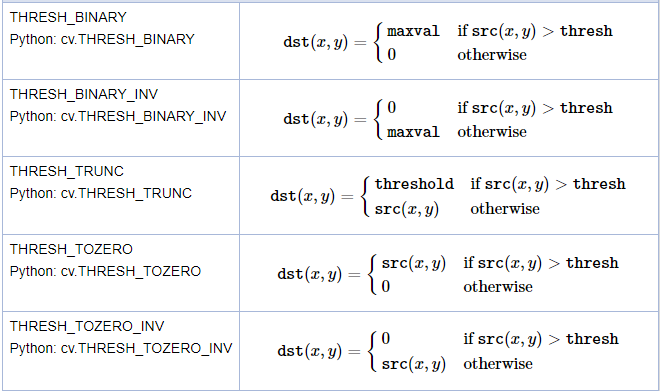


All of them are compared in the function 'simple_thres' implemented below.

In [8]:
import cv2
import matplotlib.pyplot as plt

def simple_thresh(img, th):
    """ Apply various thresholding techniques to an input image and display the results for comparison.

    Parameters:
    - img (numpy.ndarray): The input image to which thresholding is applied.
    - th (int): The threshold value for binarization.

    Returns:
    - Displays images for visual comparison between thresholding techniques.
    """
    
    # Ensure that the image is not None and exists
    assert img is not None, "File could not be read, check with os.path.exists()"

    # Apply different thresholding methods to the input image
    ret, thresh1 = cv2.threshold(img, th, 255, cv2.THRESH_BINARY)
    ret, thresh2 = cv2.threshold(img, th, 255, cv2.THRESH_BINARY_INV)
    ret, thresh3 = cv2.threshold(img, th, 255, cv2.THRESH_TRUNC)
    ret, thresh4 = cv2.threshold(img, th, 255, cv2.THRESH_TOZERO)
    ret, thresh5 = cv2.threshold(img, th, 255, cv2.THRESH_TOZERO_INV)

    # Define titles for the output images
    titles = ['Original Image', 'BINARY', 'NEGATIVE BINARY', 'TRUNC', 'TOZERO', 'NEGATIVE TOZERO']

    # Create a list of images including the original and thresholded versions
    images = [img, thresh1, thresh2, thresh3, thresh4, thresh5]

    # Create a figure for displaying the images
    plt.figure(figsize=(14, 10))

    # Loop through the images and display them in a 2x3 grid
    for i in range(6):
        plt.subplot(2, 3, i + 1)
        plt.imshow(images[i], 'gray', vmin=0, vmax=255)  # Display the images in grayscale
        plt.title(titles[i])  # Set the title for each subplot
        plt.xticks([])  # Hide x-axis ticks
        plt.yticks([])  # Hide y-axis ticks

    # Show the figure with the images
    plt.show()

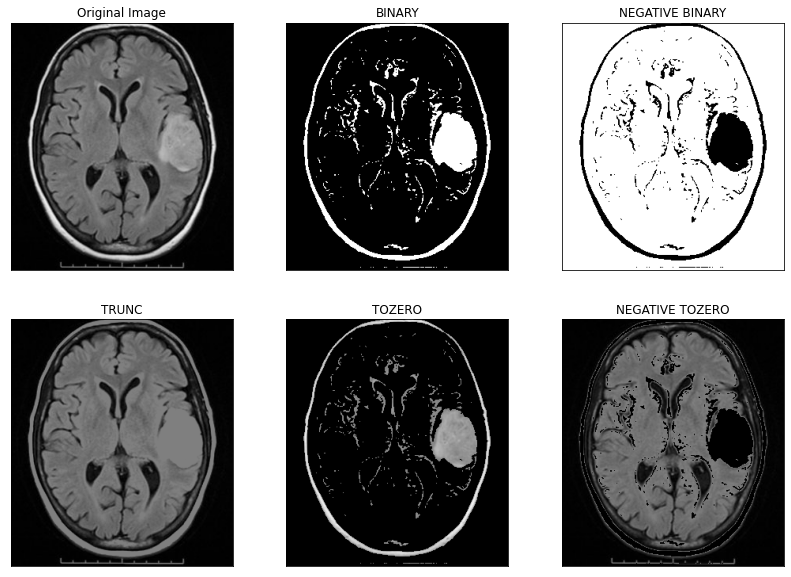

In [9]:
# Applying simple thresholding techniques for the brain MRI image
simple_thresh(brain, 127)

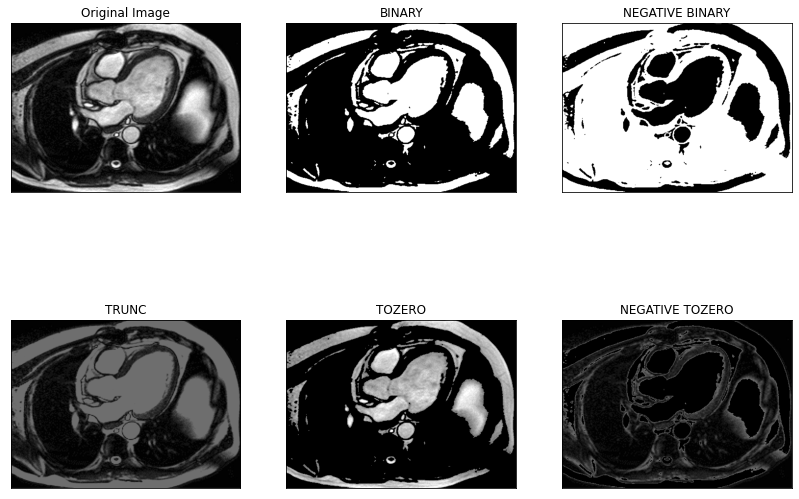

In [10]:
# Applying simple thresholding techniques for the heart MRI image
simple_thresh(heart, 110)

### Comparisson between the original image and its transformations

When the image's histogram lacks a clearly visible bimodal distribution or is heavily contaminated by noise, preprocessing techniques become essential to enhance the histogram's shape and facilitate the thresholding process. Several methods can be employed for this purpose, including histogram equalization, gamma corrections, and the application of filters.

For instance, the **median filter** is a noteworthy enhancement technique for thresholding. In contrast to the mean filter, which might blur the boundaries of larger regions due to its smoothing effect, the median filter excels at reducing small variations in texture without significantly affecting the edges of larger areas. This makes it particularly useful in scenarios where preserving fine details while reducing noise is crucial for accurate thresholding.

Additionaly, when it comes to segmentation tasks, **applying histogram equalization before thresholding** is often beneficial. The enhanced contrast and reduced sensitivity to lighting variations provided by histogram equalization can lead to more reliable and accurate thresholding results, especially in scenarios where the objects of interest have varying or subtle intensity differences with the background.

Therefore, in practice, the combination of histogram equalization, filter, or other transformations with the segmentation techniques such as thresholding is a useful preprocessing step in image segmentation, helping to address some of the limitations of thresholding, particularly in scenarios with complex scenes or challenging lighting conditions.

After seeing the results previously shown and understanding the importand of pre-processing before segmentation, the thresholding technique chosen to compare with the image transformations (median blur and histogram equalization) is the binary threholding of the OpenCV dependency.

In [11]:
def thresh_comp(img, img_eq, th_img, th_blur, th_eq):
    """
    Apply global thresholding to the original image, its median filtered version, and an equalized image,
    and display the results along with histograms and thresholds for comparison.

    Parameters:
    - img (numpy.ndarray): The original input image.
    - img_eq (numpy.ndarray): The equalized version of the input image.
    - th_img (int): Threshold for the original image.
    - th_blur (int): Threshold for the median filtered image.
    - th_eq (int): Threshold for the equalized image.

    Outputs:
    - Displays the original image and the threshold image as well as the histogram with the threshold used.
    """
    
    # Ensure that the image is not None and exists
    assert img is not None, "file could not be read, check with os.path.exists()"

    # Global thresholding for the original image
    ret1, th1 = cv.threshold(img, th_img, 255, cv.THRESH_BINARY)

    # Global thresholding for the median filtered image
    blur = cv.medianBlur(img, 5)
    ret2, th2 = cv.threshold(blur, th_blur, 255, cv.THRESH_BINARY)

    # Global thresholding for the equalized image
    ret3, th3 = cv.threshold(img_eq, th_eq, 255, cv.THRESH_BINARY)

    # Plot all the images, their histograms, and thresholds
    images = [img, 0, ret1, th1,
              blur, 0, ret2, th2,
              img_eq, 0, ret3, th3]

    titles = ['Original Image', 'Histogram', 'Global Thresholding (v={})'.format(th_img),
              'Median filtered Image', 'Histogram', 'Global Thresholding (v={})'.format(th_blur),
              'Equalized Image', 'Histogram', 'Global Thresholding (v={})'.format(th_eq)]

    plt.figure(figsize=(16, 16))
    for i in range(3):
        # Subplot of the image
        plt.subplot(3, 3, i * 3 + 1)
        plt.imshow(images[i * 4], 'gray')
        plt.title(titles[i * 3])
        plt.xticks([]), plt.yticks([])

        # Subplot of the histogram
        plt.subplot(3, 3, i * 3 + 2)
        plt.hist(images[i * 4].ravel(), 256)
        plt.axvline(x=images[i * 4 + 2], color='red', linestyle='--')
        plt.title(titles[i * 3 + 1])
        plt.xticks([]), plt.yticks([])
        plt.text(10, 500, f'Threshold: {images[i * 4 + 2]}', fontsize=12, color='red')

        # Subplot of the threshold image
        plt.subplot(3, 3, i * 3 + 3)
        plt.imshow(images[i * 4 + 3], 'gray')
        plt.title(titles[i * 3 + 2])
        plt.xticks([]), plt.yticks([])

    plt.show()

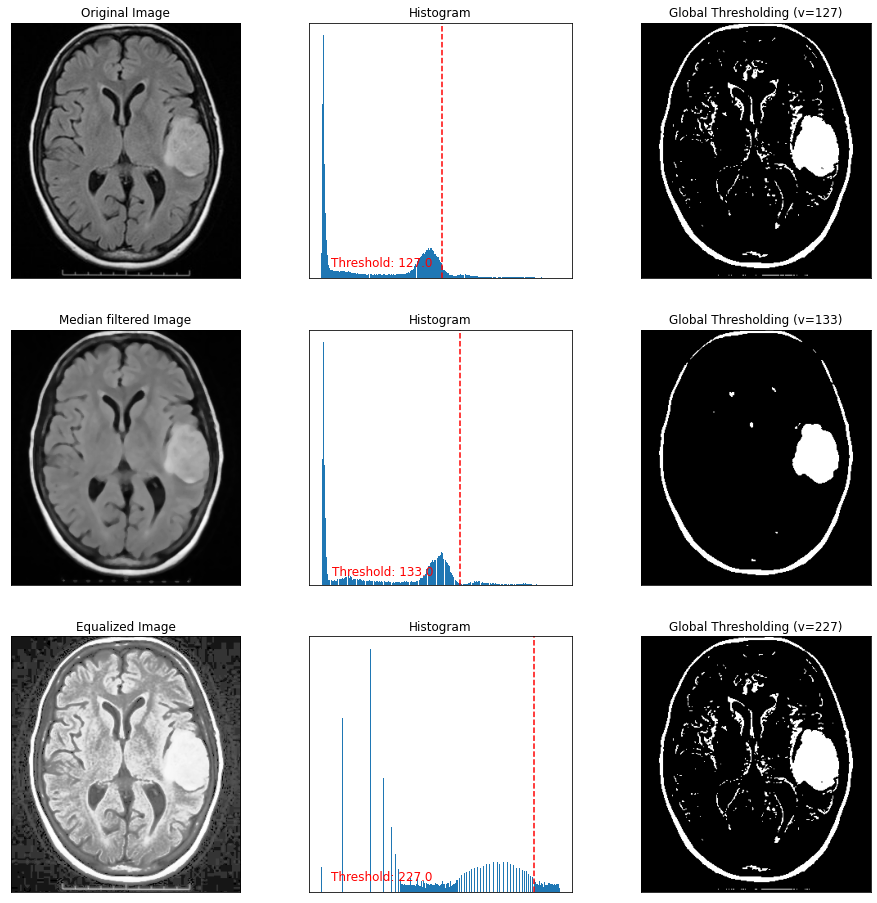

In [12]:
# Applying the chosen thresholding technique for the brain MRI image and to its transformations
thresh_comp(brain, brain_eq, 127, 133, 227)

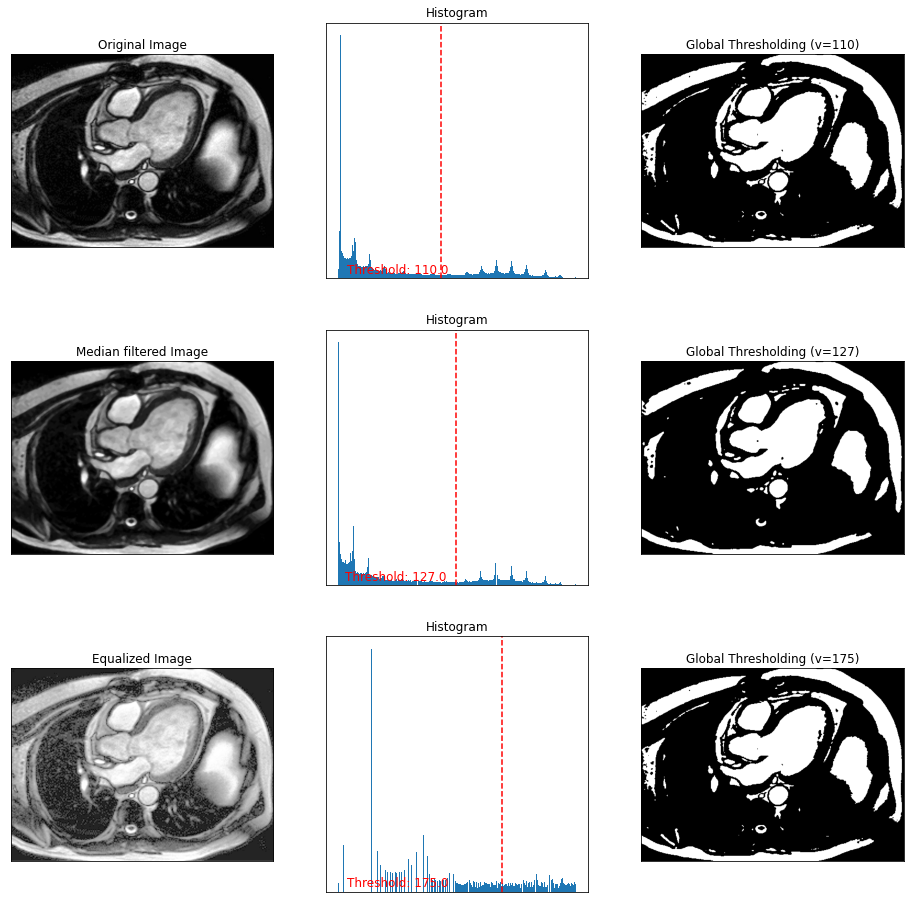

In [13]:
# Applying the chosen thresholding technique for the heart MRI image and to its transformations
thresh_comp(heart, heart_eq, 110, 127, 175)

### Otsu's Thresholding

The **Otsu's method**, also known as **Otsu's thresholding** or **maximum variance method**, is an automatic image thresholding technique used to separate an image into two classes: foreground and background. It does this by determining an optimal threshold that minimizes the intra-class variance and maximizes the inter-class variance of pixel intensities.

1. **Histogram Computation**: Otsu's method starts by computing the histogram of pixel intensities in the image. This histogram represents the frequency of each intensity level.

2. **Threshold Search**: It then systematically considers all possible threshold values between the minimum and maximum intensity levels present in the image. For each threshold, it divides the image into two classes: pixels with intensities below the threshold (background) and pixels with intensities above the threshold (foreground).

3. **Mean and Variance Computation**: The background (m_{b}, v_{b}), object (m_{f}, v_{f}) and complete image (m, v) means and varainces are computed respectively.

4. **Two Classes Variance Computation**: For each threshold, Otsu's method calculates the weighted sum of variances of the two classes:
- Intra-Class Variance (V-withing): The variance within each class, reflecting the spread of pixel intensities in that class.


$$v_{within} = P_{b}(t)v_{b} + P_{f}(t)v_{f}$$


- Inter-Class Variance (V-inbetween): The variance between the two classes, indicating how well they are separated.


$$v_{inbetween} = v - v_{within}$$


5. **Optimal Threshold Selection**: The threshold that minimizes the intra-class variance while maximizing the inter-class variance is chosen as the optimal threshold. This threshold value effectively separates the image into foreground and background, maximizing the contrast. Basically, it is the same as maximazing Q(t)


$$Q(t) = \frac{v_{inbetween}}{v_{within}}$$
    

6. **Thresholding**: Finally, the image is thresholded using the optimal threshold. Pixels with intensities greater than or equal to the threshold are assigned to the foreground, while pixels with intensities lower than the threshold are assigned to the background.

**Advantages**:
- Otsu's method is an automatic thresholding technique, which means it doesn't require manual threshold selection.
- It works well for images with bimodal or near-bimodal intensity distributions.
- The resulting threshold provides a clear separation between objects and background.

**Disadvantages**:
- Otsu's method may not perform optimally for images with complex intensity distributions, such as those with multi-modal distributions.
- It assumes that the image can be separated into two classes, which might not be suitable for all segmentation tasks.

The Otsu method will be applied with two different dependecies, OpenCV (cv2) and skimage, seeing that it will have the same results. It will be applied with the following function.

In [14]:
def otsu_thresh(img, img_eq, th, dependency):
    """ Apply Otsu's thresholding to an image with different pre-processing options and visualize the results.

    Parameters:
    - img: Original input image.
    - img_eq: Equalized version of the input image.
    - th: Threshold value for global thresholding.
    - depdendency: Depedency used for computing otsu, cv for OpenCV or sk for skimage

    Outputs:
    - Displays a series of images showing the original image, histograms, and thresholded results, with the asked dependency.
    """
    
    # Ensure that the image is not None and exists
    assert img is not None, "file could not be read, check with os.path.exists()"
    
    # Apply global thresholding
    ret1, th1 = cv.threshold(img, th, 255, cv.THRESH_BINARY)
    
    # Apply Otsu's thresholding with OpenCV (cv2) dependecy
    if dependency == 'cv':
        print('Applying OpenCV (cv2) dependency')
        # Apply Otsu's thresholding
        ret2, th2 = cv.threshold(img, 0, 255, cv.THRESH_BINARY + cv.THRESH_OTSU)

        # Apply Otsu's thresholding after Median filtering
        blur = cv.medianBlur(img, 5)
        ret3, th3 = cv.threshold(blur, 0, 255, cv.THRESH_BINARY + cv.THRESH_OTSU)

        # Apply Otsu's thresholding after histogram equalization
        ret4, th4 = cv.threshold(img_eq, 0, 255, cv.THRESH_BINARY + cv.THRESH_OTSU)
    
    # Apply Otsu's thresholding with skimage dependecy
    elif dependency == 'sk':
        print('Applying skimage dependency')
        # Apply Otsu's thresholding
        ret2 = otsu(img)
        th2 = img > ret2

        # Apply Otsu's thresholding after Median filtering
        blur = cv.medianBlur(img, 5)
        ret3 = otsu(blur)
        th3 = img > ret3

        # Apply Otsu's thresholding after histogram equalization
        ret4 = otsu(img_eq)
        th4 = img > ret4
        
    else:
        print('The "dependency" parameter can only be cv for OpenCV or sk for skimage. Please check.')

    # Prepare a list of images and titles for visualization
    images = [img, 0, ret1, th1,
              img, 0, ret2, th2,
              blur, 0, ret3, th3,
              img_eq, 0, ret4, th4]

    titles = ['Original Noisy Image', 'Histogram', 'Global Thresholding (v=127)',
              'Original Noisy Image', 'Histogram', "Otsu's Thresholding",
              'Median filtered Image', 'Histogram', "Otsu's Thresholding",
              'Equalized Image', 'Histogram', "Otsu's Thresholding"]

    # Display the images, histograms, and thresholded results
    plt.figure(figsize=(16, 16))
    for i in range(4):
        # Subplot of the image
        plt.subplot(4, 3, i * 3 + 1)
        plt.imshow(images[i * 4], 'gray')
        plt.title(titles[i * 3])
        plt.xticks([]), plt.yticks([])

        # Subplot of the histogram
        plt.subplot(4, 3, i * 3 + 2)
        plt.hist(images[i * 4].ravel(), 256)
        plt.axvline(x=images[i * 4 + 2], color='red', linestyle='--')  # Red line for the threshold
        plt.title(titles[i * 3 + 1])
        plt.xticks([]), plt.yticks([])
        plt.text(10, 500, f'Threshold: {images[i * 4 + 2]}', fontsize=12, color='red')

        # Subplot of the threshold image
        plt.subplot(4, 3, i * 3 + 3)
        plt.imshow(images[i * 4 + 3], 'gray')
        plt.title(titles[i * 3 + 2])
        plt.xticks([]), plt.yticks([])

    plt.show()

#### With OpenCV (cv2) dependency

Otsu method through the OpenCV dependency.

Applying OpenCV (cv2) dependency


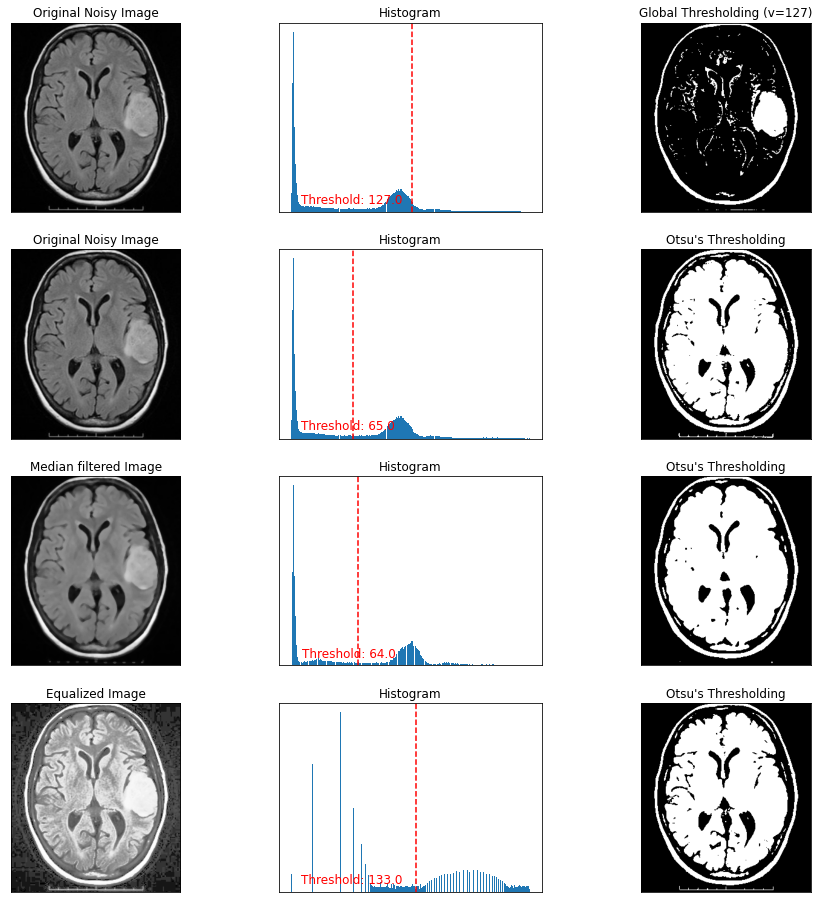

In [15]:
# Implementing otsu mehtod with the OpenCV dependency for the brain MRI image
otsu_thresh(brain, brain_eq, 127, 'cv')

Applying OpenCV (cv2) dependency


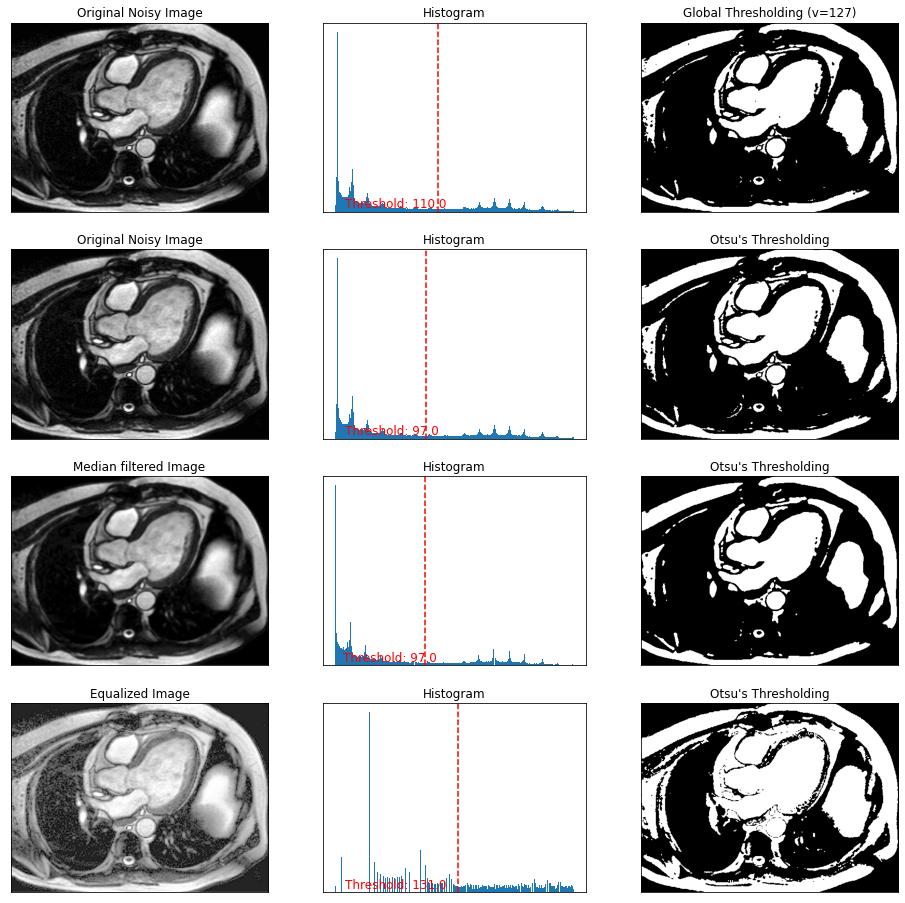

In [16]:
# Implementing otsu mehtod with the OpenCV dependency for the heart MRI image
otsu_thresh(heart, heart_eq, 110, 'cv')

#### Using skimage dependency

Otsu method through the skimage dependency.

Applying skimage dependency


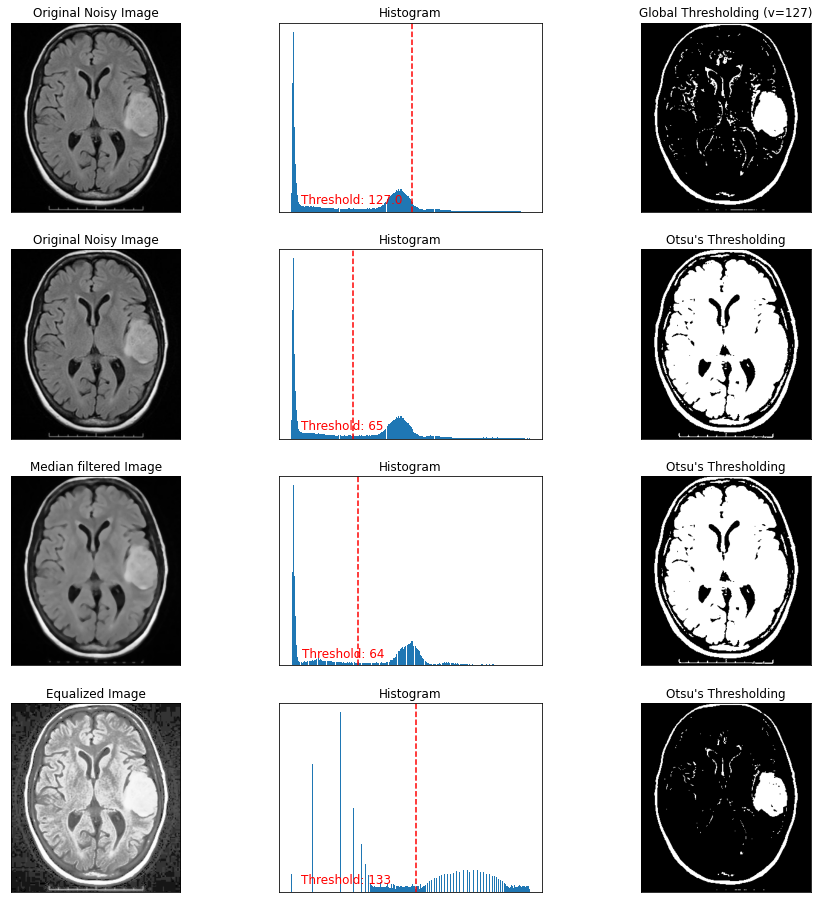

In [17]:
# Implementing otsu mehtod with the skimage dependency for the brain MRI image
otsu_thresh(brain, brain_eq, 127, 'sk')

Applying skimage dependency


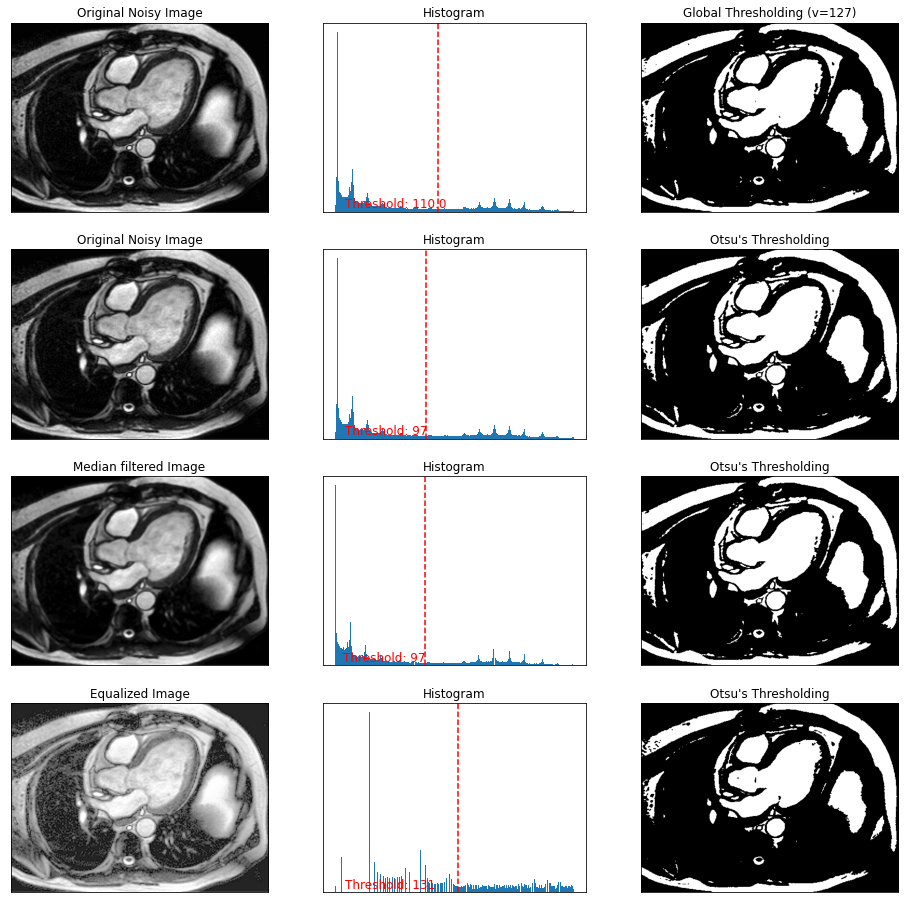

In [18]:
# Implementing otsu mehtod with the skimage dependency for the heart MRI image
otsu_thresh(heart, heart_eq, 110, 'sk')

Then, OpenCV and scikit-image (skimage) are two popular libraries for image processing and computer vision, and they provide similar functionality, including the Otsu's thresholding method.

**Similarities:**
1. **Algorithm:** Both OpenCV and skimage use the same underlying Otsu's thresholding algorithm. Otsu's method seeks to find the optimal threshold that minimizes the intra-class variance, effectively separating the image into two classes, typically foreground and background.

2. **Function Name:** Both libraries provide a function for Otsu's thresholding, making it easy to apply the algorithm. In OpenCV, you use `cv2.threshold` with the flag `cv2.THRESH_OTSU`, and in skimage, you can use `skimage.filters.threshold_otsu`.

**Differences:**
1. **Usage:** The primary difference is in how you use these functions in your code. In OpenCV, `cv2.threshold` expects an input image, a threshold value (which is ignored), a maximum value, and a thresholding type. In contrast, skimage's `threshold_otsu` function expects only the input image.

2. **Return Value:** OpenCV's `cv2.threshold` returns two values: the threshold value that was computed (using Otsu's method) and the thresholded image. In contrast, skimage's `threshold_otsu` function returns only the computed threshold value. To threshold the image, you need to apply this threshold to the image separately.

Thus, both libraries use Otsu's method for thresholding, but the way you apply the method and handle the thresholded image differs. In OpenCV, the thresholded image is directly returned, while in skimage, you obtain the threshold value first and then apply it to the image using boolean indexing.

## Region Growing

**Region Growing** is a segmentation technique that involves selecting a seed pixel (or a group of pixels) within an area of interest in an image, and then iteratively comparing and adding contiguous pixels to the region of interest (ROI) based on a homogeneity condition. This process is repeated across the entire image to segment objects or regions with similar characteristics. The key aspects of region growing are as follows:

- **Seed Selection**: The process begins by selecting a seed pixel or group of pixels, which can be chosen interactively by a user or automatically by algorithms.

- **Contiguity Comparison**: In each step, the algorithm compares the characteristics (e.g., intensity values) of contiguous pixels to the seed pixel. If these pixels meet a specified homogeneity condition, they are added to the ROI. The homogeneity condition is often defined based on intensity similarity or other relevant image properties.

- **Connectivity Consideration**: To facilitate region growing, it is essential to define the connectivity or neighborhood relationships between pixels. This defines how pixels are considered in relation to one another during the comparison process.

   - **Neighborhood of 4**: When considering only the vertical and horizontal directions with respect to one pixel, it is referred to as a neighborhood of 4. This means that a pixel is compared to its top, bottom, left, and right neighbors.
   
   - **Neighborhood of 8**: If the initial pixel is compared with all its adjacent pixels, it is known as a neighborhood of 8. In this case, a pixel is compared to its top, bottom, left, right, and diagonal neighbors.

- **Impact of Connectivity**: The choice of connectivity (4-connectivity or 8-connectivity) can significantly influence the final segmentation result. A neighborhood of 4 is more restrictive because it only considers horizontal and vertical relationships, while a neighborhood of 8 is less restrictive as it includes diagonal comparisons.

- **Spatial Restriction**: Smaller neighborhood definitions lead to more spatially restrictive growth of regions. Using a neighborhood of 4 limits the region's expansion to adjacent pixels in the vertical and horizontal directions, while a neighborhood of 8 allows for broader region growth, including diagonal directions.

In order to apply this segmentation technique, the tolerance should be found, using the function 'find_tol' shown below.

In [19]:
def find_tol(img, seed):
    """ Apply flood fill with different tolerance values to an image and display the results for comparison.

    Parameters:
    - img: Original input image.
    - seed: Seed point for the flood fill operation.

    Outputs:
    - Displays a grid of images with varying tolerance values for flood fill.
    """
    output = []  # Initialize a list to store flood fill results for different tolerances.

    # Iterate through different tolerance values.
    for i in range(8):
        tol = 5 + 10 * i  # Calculate the tolerance value.
        # Apply flood fill to the image with the current tolerance.
        output.append(flood_fill(img, seed, 255, tolerance=tol))

    # Initialize a plot with a grid of subplots.
    fig, ax = plt.subplots(nrows=3, ncols=3, figsize=(12, 12))

    # Place the original image in the top-left subplot.
    ax[0, 0].imshow(img, cmap=plt.cm.gray)
    ax[0, 0].set_title('Original')
    ax[0, 0].axis('off')

    # Plot all eight different tolerances for comparison in the remaining subplots.
    for i in range(8):
        m, n = np.unravel_index(i + 1, (3, 3))  # Calculate the row and column indices for subplots.
        ax[m, n].imshow(output[i], cmap=plt.cm.gray)
        ax[m, n].set_title(f'Tolerance {5 + 10 * i}')
        ax[m, n].axis('off')
        ax[m, n].plot(seed[1], seed[0], 'ro')  # Mark the seed point with a red dot.

    fig.tight_layout()  # Adjust subplot layout.
    plt.show

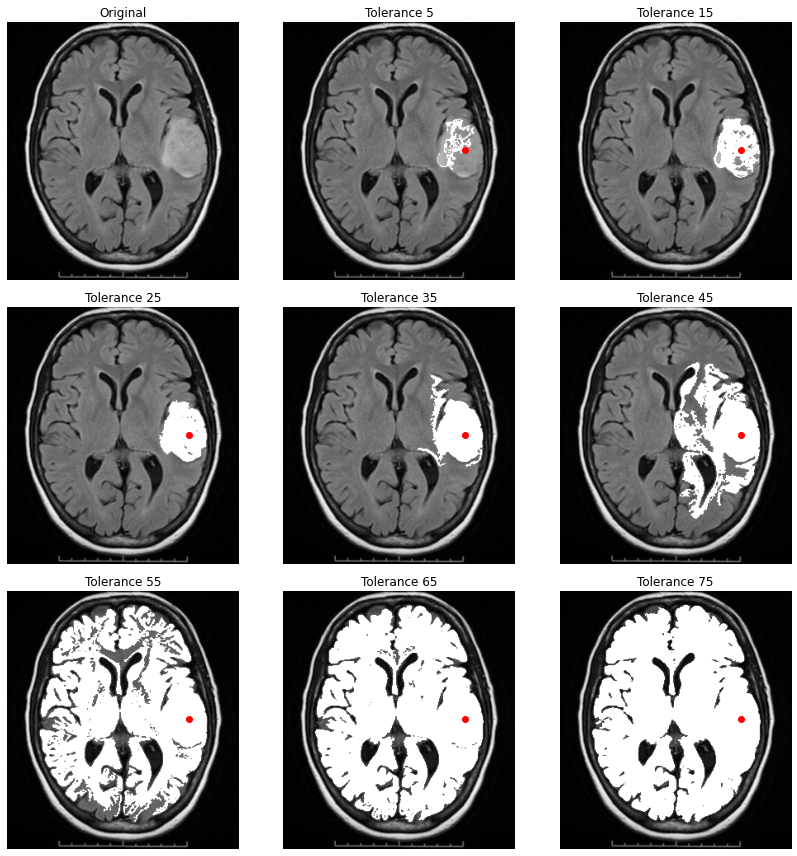

In [20]:
# Choosing the tolerance for brain MRI image
# Establish the seed
seed_brain = (155, 220)
# Finding the correct tolerance
find_tol(brain, seed_brain)

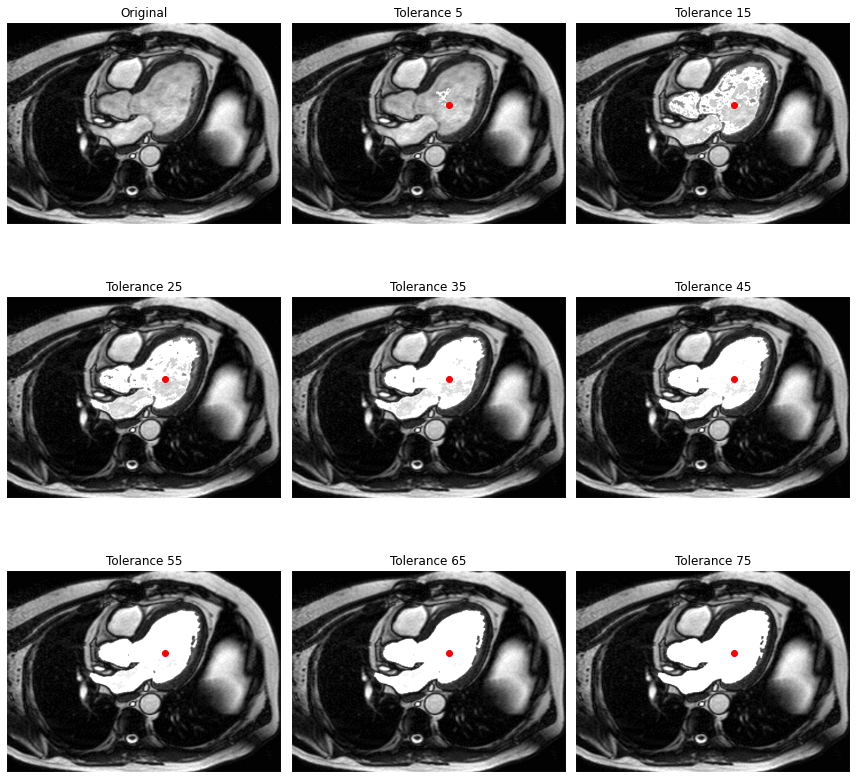

In [21]:
# Choosing the tolerance for brain MRI image
# Establish the seed
seed_heart = (150, 290)
# Finding the correct tolerance
find_tol(heart, seed_heart)

After finding an optimal range for the tolerance for each image, the Region of Interest (ROI) is computed, as well as the histogram with the function 'region_growing' implemented below.

In [22]:
def region_growing(img, seed, tol, con):
    """ Apply region growing to an image from a seed point with a specified tolerance and connectivity and display the results.

    Parameters:
    - img: Original input image.
    - seed: Seed point for region growing.
    - tol: Tolerance value for region growing.
    - con: Connectivity type for region growing.

    Outputs:
    - Displays the original image, the result after region growing, the region of interest (ROI), and a histogram.
    """
    # Apply region growing using flood fill with specified parameters.
    region = flood_fill(img, seed, 255, tolerance=tol, connectivity=con)
    
    # Create a binary mask for the Region of Interest (ROI).
    roi_mask = (region == 255).astype(int)
    
    # Apply the binary mask to the original image to obtain the ROI.
    roi_image = img * roi_mask
    
    # Initialize a figure with four subplots.
    fig, ax = plt.subplots(ncols=4, figsize=(18, 12))

    # Display the original image in the first subplot.
    ax[0].imshow(img, cmap=plt.cm.gray)
    ax[0].set_title('Original')
    ax[0].axis('off')

    # Display the image after region growing in the second subplot.
    ax[1].imshow(region, cmap=plt.cm.gray)
    ax[1].plot(seed[1], seed[0], 'ro')  # Mark the seed point with a red dot.
    ax[1].set_title('After flood fill')
    ax[1].axis('off')

    # Display the binary ROI mask in the third subplot.
    ax[2].imshow(roi_mask, cmap=plt.cm.gray)
    ax[2].set_title('Region of Interest (ROI)')
    ax[2].axis('off')
    
    # Display the histogram of the region after region growing in the fourth subplot.
    ax[3].hist(region.ravel(), bins=256)
    ax[3].set_title('Histogram')

    plt.show()  # Display the figure with all subplots.

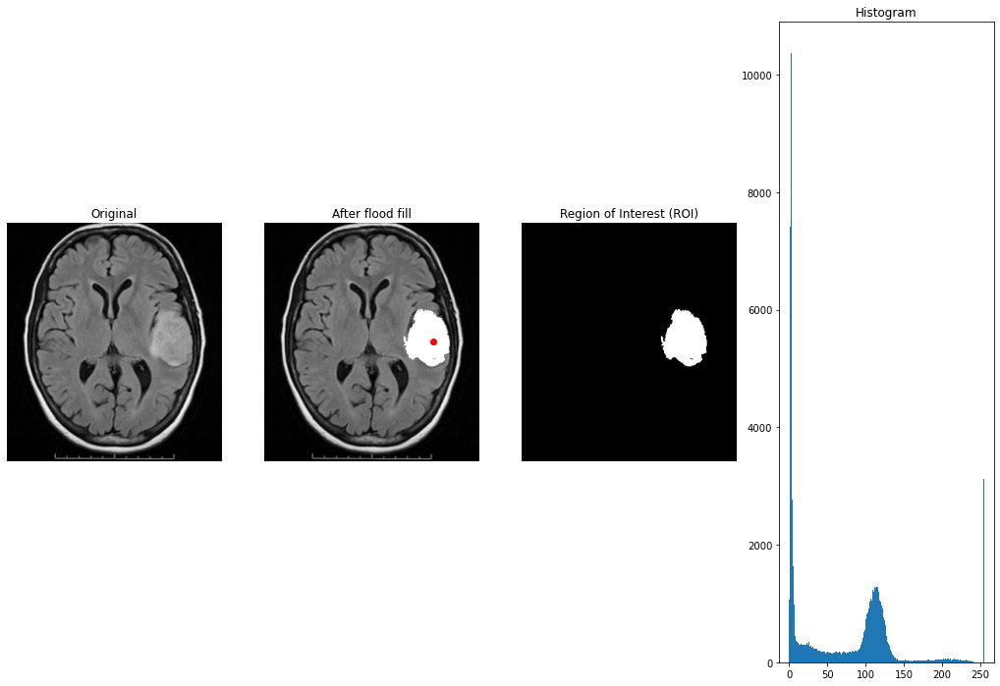

In [23]:
# Applying region growing to the brain MRI image
region_growing(brain, seed_brain, 30, 8)

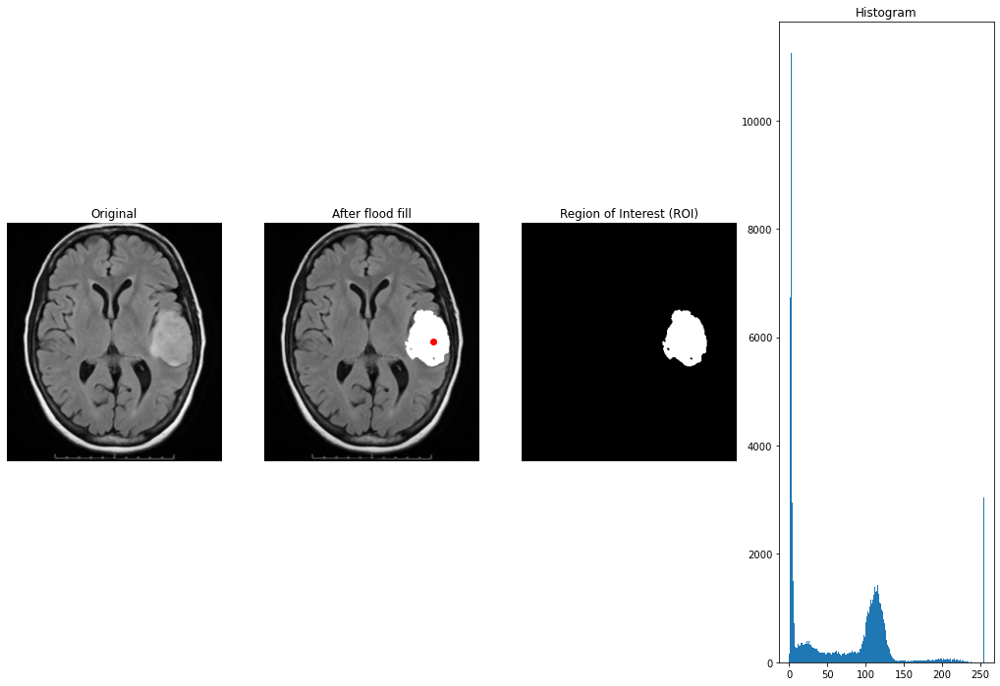

In [24]:
# Applying region growing to the median filtered brain MRI image
brain_blur = cv.medianBlur(brain, 3)
region_growing(brain_blur, seed_brain, 25, 8)

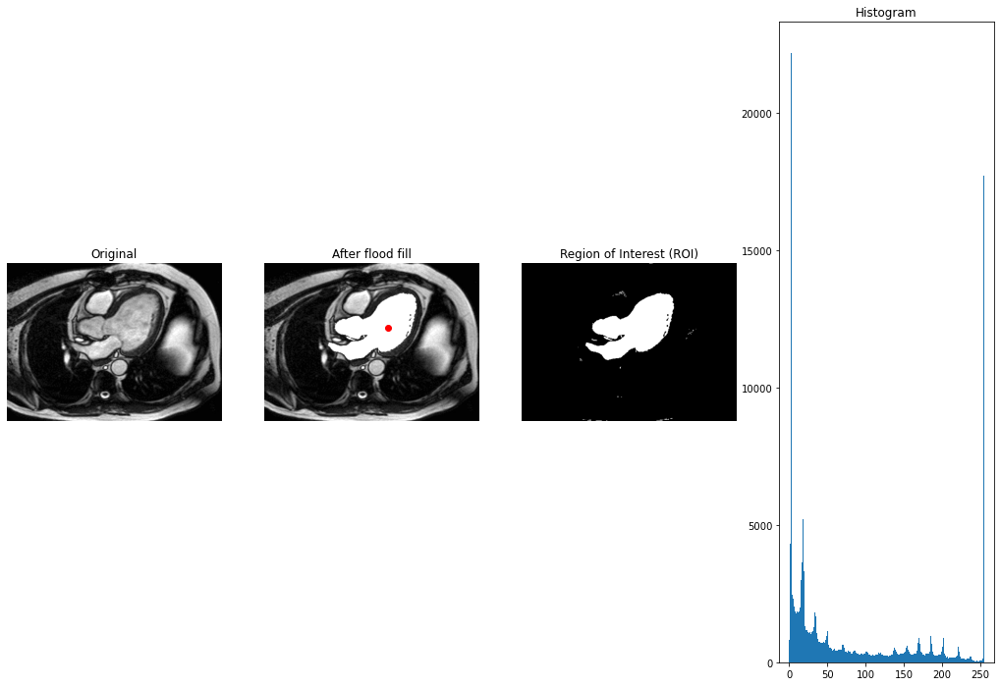

In [25]:
# Applying region growing to the brain MRI image
region_growing(heart, seed_heart, 90, 8)
# tolerance=50, connectivity = 1

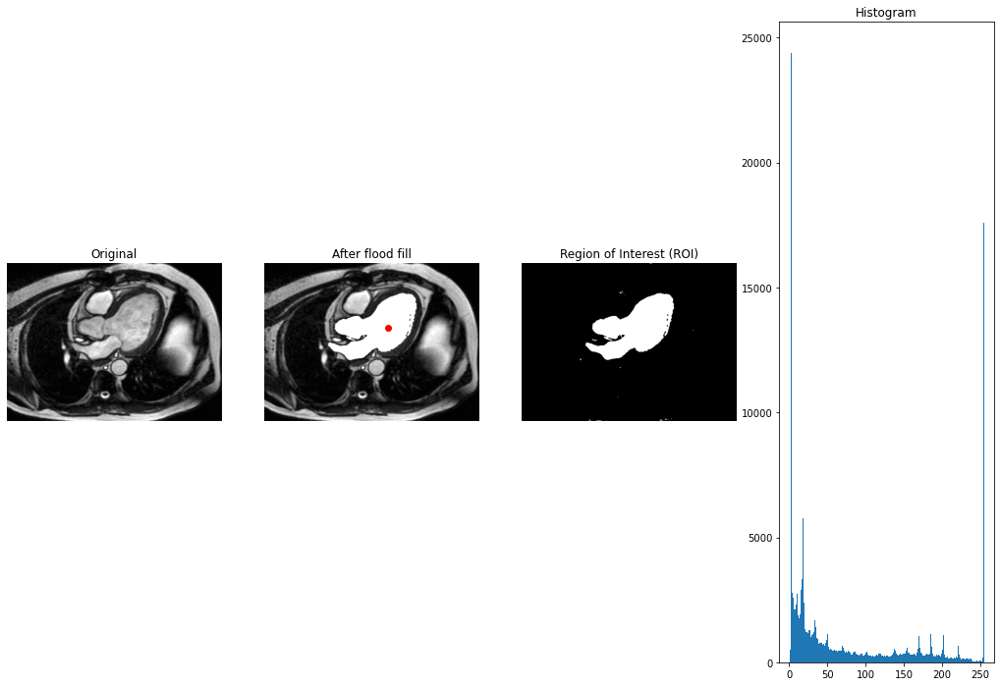

In [26]:
# Applying region growing to the median filtered heart MRI image
heart_blur = cv.medianBlur(heart, 3)
region_growing(heart_blur, seed_heart, 90, 8)

## Watershed 

**Watershed segmentation** is an image processing technique used for segmenting objects or regions of interest. It is particularly useful when the object of interest has well-defined boundaries or when there is a significant contrast between the object and the background. In concrete, watershed segmentation algorithm is predominantly used in several applications, such as medical image analysis, remote sensing, and object recognition. At this project, we are going to focus on using it at medical image analysis.

The functioning of this algorithm can be explained in several steps:
-	**Grayscale Conversion**: First, we want our input image to be in grayscale, so that it is simplified, and it is easier to work with it.
-	**Image preprocessing**: Before applying watershed, we have to perform some preprocessing to our image, to highlight important features and reduce noise (to avoid over-segmentation). Some preprocessing techniques that can be carried out can be smoothing, edge detection or gradient computation. In our code, we worked with the module of the gradient image.
-	**Markers selection**: To guide the algorithm, we need to define markers. Markers are essentially seeds or starting points that indicate the regions you want to segment. There are two types of markers:
    -	**Foreground markers**: Placed on the objects or areas you want to segment.
    -	**Background markers**: Placed on the areas that are not part of the objects of interest, generally the background.
In our case, we just used foreground markers since that was enough to clearly segment our areas of interest.
-	**Watershed transform**: Here, local minima and maxima play a really important role. This algorithm assumes that the different objects in the image are represented as if they were a valley. The top part of the valley (which is considered the maximum) is the connection between two local minimums. Hence, the local minimums are used as starting points to reach the maximums. The edges of the object are considered to be the top part of the valleys, while the interior of the object corresponds to the bottom of the valley.
    Therefore, the flooding process starts from each of the local minimums (or seeds if you have used them) and gradually fills up the surrounding area until they merge with adjacent regions by simply connecting local minimums and hence acquiring the edges of the object you are segmenting.
    If you don’t define any starting point (by using a seed), the process will be made with all the local minimums of the image, and therefore the output image will tend to be over-segmented.   

Watershed segmentation algorithm is a powerful technique for image segmentation, but it might be sensitive to noise and may over-segment an image if it is not used carefully. Proper marker selection and preprocessing are crucial to achieving good results.


## Watershed applied to the brain MRI

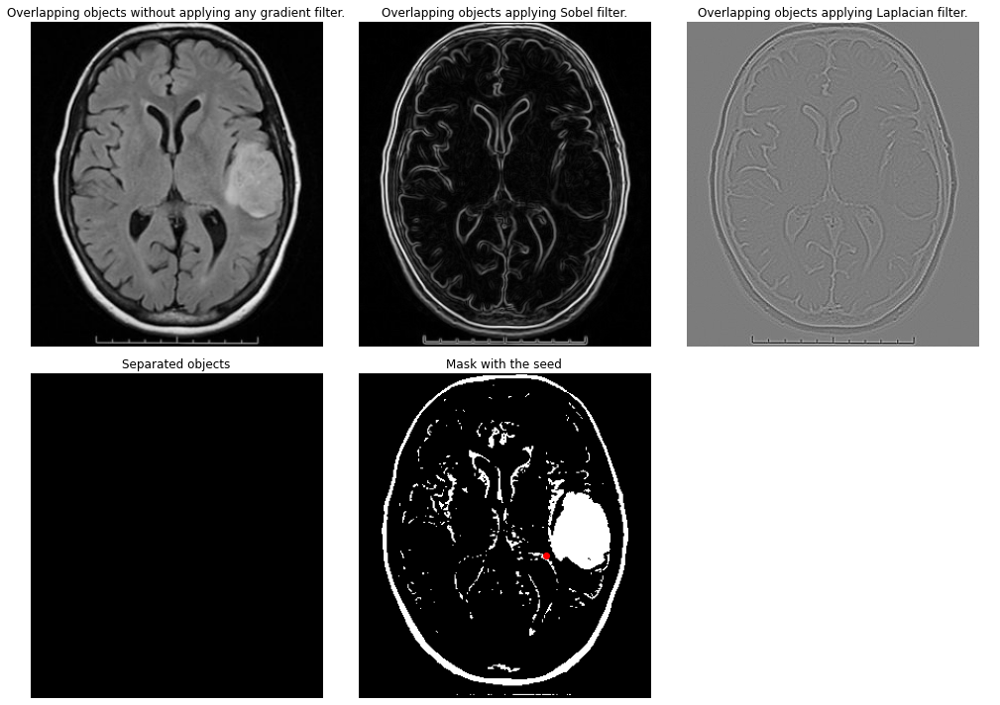

In [27]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import ndimage as ndi
from skimage.segmentation import watershed,flood_fill



# Calculation of the gradient image with Sobel and Laplacian.
sobelx = cv.Sobel(brain,cv.CV_64F,1,0,ksize=3) # X direction of the gradient image calculated with Sobel.
sobely = cv.Sobel(brain,cv.CV_64F,0,1,ksize=3) # Y direction of the gradient image calculated with Sobel.
sobel = np.sqrt(sobelx**2 + sobely**2) # Module of the gradient image calculated with Sobel, which is going to be our input image.
laplacian = cv.Laplacian(brain,cv.CV_64F) # Gradient image calculated with Laplacian, but we are not going to use it in our code.


# Calculation of the markers variable by creating a matrix full of 0's and then setting a value of 1 at the coordinate (180,175), which is contained in our area of interest.
# We tried with other coordinates inside the area of interest, but this was the one that worked the best at segmenting it.
markers = np.zeros(shape = brain.shape) 
markers_sobel = np.zeros(shape = sobel.shape) 
markers_laplacian = np.zeros(shape = laplacian.shape) 
#markers[195][171] = 1
markers[180][175] = 1 
markers_sobel[180][175] = 1 
markers_laplacian[180][175] = 1 
#markers[200][190] = 1
#markers[215][165] = 1
#markers[200][135] = 1


# Calculation of our mask with thresholding.
ret1,th1 = cv.threshold(brain,127,255,cv.THRESH_BINARY) 


# Watershed function with 3 parameters, the input image (brain image, Sobel gradient image or Laplacian gradient image), the matrix with the markers, and the mask.
labels = watershed(brain, markers=markers, mask = th1) 
labels_sobel = watershed(sobel, markers=markers_sobel, mask = th1) 
labels_laplacian = watershed(laplacian, markers=markers_laplacian, mask = th1) 

# Initialize a figure with maximum 6 subplots
fig, ax = plt.subplots(2,3, figsize=(14, 10), sharex=True, sharey=True) 

# Display the brain image.
ax[0,0].imshow(brain, cmap=plt.cm.gray)
ax[0,0].set_title('Overlapping objects without applying any gradient filter.')

# Display the Sobel gradient image.
ax[0,1].imshow(sobel, cmap=plt.cm.gray)
ax[0,1].set_title('Overlapping objects applying Sobel filter.')

# Display the Laplacian gradient image.
ax[0,2].imshow(laplacian, cmap=plt.cm.gray)
ax[0,2].set_title('Overlapping objects applying Laplacian filter.')

# Display the segmented image (output of applying watershed function).
ax[1,0].imshow(labels_sobel, cmap=plt.cm.gray)
ax[1,0].set_title('Separated objects')

# Display the mask with the seed as a red dot.
ax[1,1].imshow(th1, cmap=plt.cm.gray)
ax[1,1].plot(180,175,'ro')
ax[1,1].set_title('Mask with the seed')

for a in ax.ravel():
    a.set_axis_off()

fig.tight_layout()
plt.show() # Display all the figures.

## Watershed applied to the heart MRI

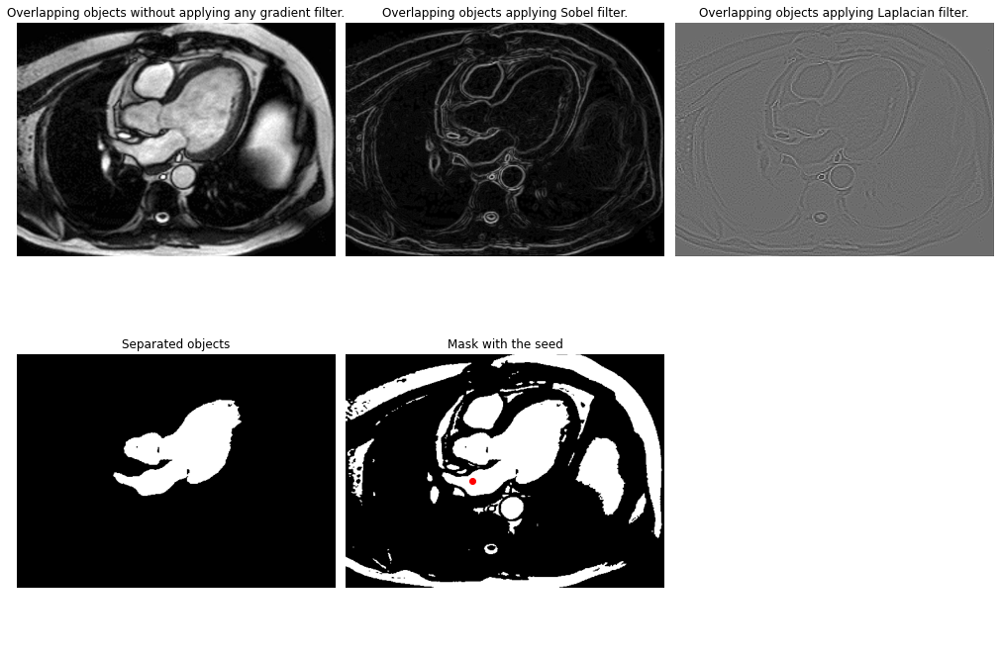

In [28]:
# Calculation of the gradient image with Sobel and Laplacian.
sobelx = cv.Sobel(heart,cv.CV_64F,1,0,ksize=3) # X direction of the gradient image calculated with Sobel.
sobely = cv.Sobel(heart,cv.CV_64F,0,1,ksize=3) # Y direction of the gradient image calculated with Sobel.
sobel = np.sqrt(sobelx**2 + sobely**2) # Module of the gradient image calculated with Sobel, which is going to be our input image.
laplacian = cv.Laplacian(heart,cv.CV_64F) # Gradient image calculated with Laplacian, but we are not going to use it in our code.


# Calculation of the markers variable by creating a matrix full of 0's and then setting a value of 1 at the coordinate (200,200), which is contained in our area of interest.
# We tried with other coordinates inside the area of interest, but this was the one that worked the best at segmenting it.
markers = np.zeros(shape = heart.shape) 
markers_sobel = np.zeros(shape = sobel.shape) 
markers_laplacian = np.zeros(shape = laplacian.shape) 
#markers[195][171] = 1
markers[200][200] = 1
markers_sobel[200][200] = 1
markers_laplacian[200][200] = 1
#markers[200][190] = 1
#markers[215][165] = 1
#markers[200][135] = 1


# Calculation of our mask with thresholding.
ret1,th1 = cv.threshold(heart,127,255,cv.THRESH_BINARY) 


# Watershed function with 3 parameters, the input image (brain image, Sobel gradient image or Laplacian gradient image), the matrix with the markers, and the mask.
labels = watershed(heart, markers=markers, mask = th1) 
labels_sobel = watershed(sobel, markers=markers_sobel, mask = th1) 
labels_laplacian = watershed(laplacian, markers=markers_laplacian, mask = th1) 

# Initialize a figure with maximum 6 subplots
fig, ax = plt.subplots(2,3, figsize=(14, 10), sharex=True, sharey=True) 

# Display the brain image.
ax[0,0].imshow(heart, cmap=plt.cm.gray)
ax[0,0].set_title('Overlapping objects without applying any gradient filter.')

# Display the Sobel gradient image.
ax[0,1].imshow(sobel, cmap=plt.cm.gray)
ax[0,1].set_title('Overlapping objects applying Sobel filter.')

# Display the Laplacian gradient image.
ax[0,2].imshow(laplacian, cmap=plt.cm.gray)
ax[0,2].set_title('Overlapping objects applying Laplacian filter.')

# Display the segmented image (output of applying watershed function).
ax[1,0].imshow(labels_sobel, cmap=plt.cm.gray)
ax[1,0].set_title('Separated objects')

# Display the mask with the seed as a red dot.
ax[1,1].imshow(th1, cmap=plt.cm.gray)
ax[1,1].plot(200,200,'ro')
ax[1,1].set_title('Mask with the seed')

for a in ax.ravel():
    a.set_axis_off()

fig.tight_layout()
plt.show() # Display all the figures.

## Active Contour

In general, to solve for situations in which by applying derivative masks for edge detection in discontinuous areas and contour points that do not belong may appear on the object boundary (due to noise), contour tracking is used. The general implementation method will consist of:

   - a) First implementing a **smoothing filter**, for instance Gaussian, to increase the effectiveness of the segmentation. As read in the literature concercing this algorithm it is advised to smooth images before analyzing, solving for unwanted contour points that may appear due to noise.
   
   - b) Then applying **contour tracking**: it is an iterative process that consists of fitting an initial curve to the contour of the region of interest until a complete boundary is achieved.
  
In addition to this, we will, if found necessary, apply a **background minimization**, which consists of a series of morphological operations (further explained in the cells below) which intend to minimize the regions that are not of interest (background or non-tumorous regions).

Going into more detail regarding the operation of the snakes algorithm, its fundamental idea is to deform a curve over multiple iterations to fit the desired boundary that correctly defines the ROI within an image, by minimizing an energy function partly defined by the image and partly by the contour shape. Here are the steps:

   - 1) First **initialize a curve/contour within the image:** given an approximate boundary around the ROI. The initial contour may be user-defined (manually) or automatically generated.
   
   - 2) **Minimize an energy function associated with the contour:** this energy is a combination of internal energy (smoothness) and external energy (attraction toward the object's boundaries). The energy function is mathematically defined to encourage the contour to fit the object's boundary.
   
   - 3) **Deformation:** the contour evolves or deforms iteratively in the direction that minimizes the energy function, so that it is near pixels with high gradient (edges). Typically, gradient descent is used to update the contour. This means the contour is shifted in the direction that minimizes the energy, trying to fit the boundary better at each iteration.
   
   - 4) **Convergence:** the algorithm iterates until the contour converges to the desired boundary or until a predefined stopping criterion is met. This criterion will appear in the function called as 'converge'.

For the heart MRI image the **left ventricle**, the **left atrium** and the **aorta** will be our ROI to segment. Due to the complexity of this regions (there other anatomical structures within the splines of the desired contour to obtain and presents sharps turns) we have decided to initially go for a **manually defined initialization curve**. This consists of a ordered list of manually set 2D vertices connected by a line, that roughly describe the contour that is intended to be obtained after applying the snakes algorithm. By doing so we are providing a little assistance to the algorithm, because by itself it does not solve for previously mentioned issues.

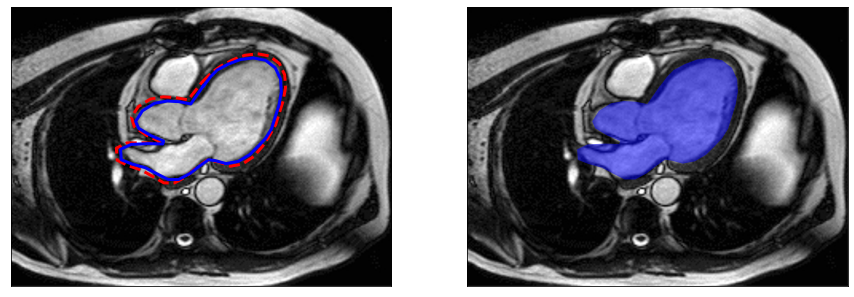

In [29]:
from scipy.interpolate import splprep, splev

# Define the (x, y) coordinates of the points for initialization
init_points = np.array([
    [255, 100],
    [280, 78],
    [310, 65],
    [340, 64],
    [360, 80],
    [362, 120],
    [330, 190],
    [290, 211],
    [263, 203],
    [245, 215],
    [210, 235],
    [170, 215],
    [140, 200],
    [140, 188],
    [160, 180],
    [200, 180],
    [180, 170],
    [160, 150],
    [180, 125],
    [210, 120],
    [235, 123]
])

# init_points = init_points[:, ::-1]

# Use spline interpolation to add intermediate points to the ones set and connect them in a continuous line.
num_intermediate_points = 20
tck, _ = splprep(init_points.T, s=0)
u_new = np.linspace(0, 1, len(init_points) + num_intermediate_points)
x_new, y_new = splev(u_new, tck)
init_points = np.column_stack((y_new, x_new)).astype(int)
init_points = np.vstack((init_points, init_points[0]))

snake = active_contour(
    gaussian(heart, 3, preserve_range=False), init_points, alpha=0.001, beta=10, gamma=0.001, 
                                                        max_px_move=0.5, 
                                                        w_line=-10, w_edge=2, convergence=5)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 15))  

ax1.imshow(heart, cmap=plt.cm.gray)
ax1.plot(init_points[:, 1], init_points[:, 0], '--r', lw=3)
ax1.plot(snake[:, 1], snake[:, 0], '-b', lw=3)
ax1.set_xticks([]), ax1.set_yticks([])
ax1.axis([0, heart.shape[1], heart.shape[0], 0])

ax2.imshow(heart, cmap=plt.cm.gray)
ax2.fill(snake[:, 1], snake[:, 0], 'b', alpha=0.5)
ax2.set_xticks([]), ax2.set_yticks([])
ax2.axis([0, heart.shape[1], heart.shape[0], 0])

plt.show()

The result obtained is decent but there can be observed parts of the final contour that are still attracted to other elements in the vicinities. Plus, in this case the left atria and the aorta are very close together but not joined, the algorithm is not able to differentiate this. In fact we have seen that, when setting the initialization curve manually, the results will strongly depend on that curve, hence why the algorithm does not reach far into the spline between the aorta and the left atria

To improve the performance of the algorithm we will apply a technique called **background minimization**. It aims to minimize the information from regions that are not of interest while maintaining the features of the ROI. Background minimization works in the following way. The background is eliminated by using two levels of morphological operations. The ﬁrst level morphological reconstruction is by erosion while the second level morphological reconstruction is by dilation. Below a more detailed explanation is provided.

**Opening** is primarily used to remove noise, small objects, and fine details while preserving the larger structures or objects in an image. 

- **Erosion** is the first step of the opening operation. It involves moving a small structuring element (a small binary kernel, in our case a disk will be used) across the image. At each position of the structuring element, the center of the element is aligned with the corresponding pixel in the image. If all the pixels in the structuring element coincide with foreground pixels (non-zero) in the image, the center pixel of the structuring element is set to the foreground value. If any of the pixels in the structuring element overlap with background pixels (zero) in the image, the center pixel of the structuring element is set to the background value. The result of erosion is an image where foreground regions are shrunk or eroded away, and noise or small features are removed.

- **Dilation** is the second step of the opening operation. It involves moving the same structuring element across the eroded image. Similar to erosion, the structuring element is aligned with the image's pixels. If any part of the structuring element overlaps with a foreground pixel in the image, the center pixel of the structuring element is set to the foreground value. If all parts of the structuring element overlap with background pixels, the center pixel of the structuring element is set to the background value. The result of dilation is an image where the remaining foreground regions expand, and small gaps or holes within the objects are filled.

The combination of erosion followed by dilation in morphological opening results in the **preservation of the larger connected structures and smoothes the contours of objects** hence why it is very useful for segmentation.

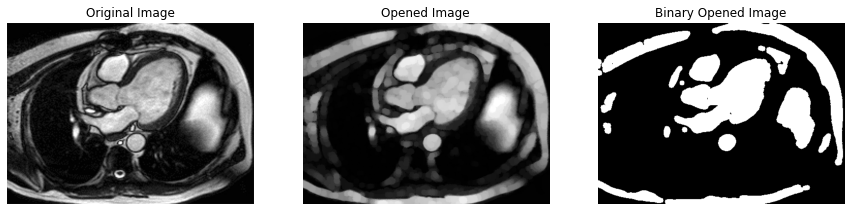

In [30]:
from skimage import io, color, morphology
import cv2 as cv 

# Define the structuring element (e.g., a disk) and its size and apply the morphological opening operation
selem_op = morphology.disk(5)
opened_image = morphology.opening(heart, selem_op)

# Obtain binary image to discriminate better between close together regions
ret, binary_opening_image = cv.threshold(opened_image, 110, 255, cv.THRESH_BINARY)

# Display the original and opened images
fig, axes = plt.subplots(1, 3, figsize=(15, 10))
ax = axes.ravel()

ax[0].imshow(heart, cmap=plt.cm.gray)
ax[0].set_title('Original Image')
ax[0].axis('off')

ax[1].imshow(opened_image, cmap=plt.cm.gray)
ax[1].set_title('Opened Image')
ax[1].axis('off')

ax[2].imshow(binary_opening_image, cmap=plt.cm.gray)
ax[2].set_title('Binary Opened Image')
ax[2].axis('off')

plt.show()

On the 'Opened Image' it can be seen how information from the background is minimized while maintaining the features of the ROI. Then, binary images are plotted to show what the results of applying the morphological operation are. Now the regions that are close to our ROI appear further away from it.

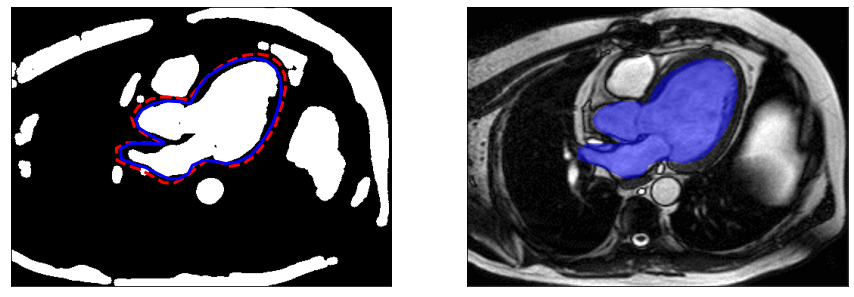

In [31]:
from scipy.interpolate import splprep, splev

# Define the (x, y) coordinates of the points for initialization
init_points = np.array([
    [255, 100],
    [280, 78],
    [310, 65],
    [340, 64],
    [360, 80],
    [362, 120],
    [330, 190],
    [290, 211],
    [263, 203],
    [245, 215],
    [210, 235],
    [170, 215],
    [140, 200],
    [140, 188],
    [160, 180],
    [200, 180],
    [180, 170],
    [160, 150],
    [180, 125],
    [210, 120],
    [235, 123]
])

# init_points = init_points[:, ::-1]
# Use spline interpolation to add intermediate points
num_intermediate_points = 20
tck, _ = splprep(init_points.T, s=0)
u_new = np.linspace(0, 1, len(init_points) + num_intermediate_points)
x_new, y_new = splev(u_new, tck)
init_points = np.column_stack((y_new, x_new)).astype(int)
init_points = np.vstack((init_points, init_points[0]))


opening_snake = active_contour(
    gaussian(binary_opening_image, 3, preserve_range=False), init_points, alpha=0.001, beta=10, gamma=0.001, 
                                                        max_px_move=0.5, 
                                                        w_line=-5, w_edge=10, convergence=2)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 12))

ax1.imshow(binary_opening_image, cmap=plt.cm.gray)
ax1.plot(init_points[:, 1], init_points[:, 0], '--r', lw=3)
ax1.plot(opening_snake[:, 1], opening_snake[:, 0], '-b', lw=3)
ax1.set_xticks([]), ax1.set_yticks([])
ax1.axis([0, binary_opening_image.shape[1], binary_opening_image.shape[0], 0])

ax2.imshow(heart, cmap=plt.cm.gray)
ax2.fill(opening_snake[:, 1], opening_snake[:, 0], 'b', alpha=0.5)
ax2.set_xticks([]), ax2.set_yticks([])
ax2.axis([0, heart.shape[1], heart.shape[0], 0])

plt.show()

Now we compare these results with the segmented region obtained by applying a background minimization and a **semi-automatic** method of initializing the curve for the algorithm. This method is faster than manually selecting points and it consists of encapsulating the ROI with a pre-defined function, like a circle our in our case an **ellipse**. After some parameter tuning this would be the best results that we have been able to obtain.

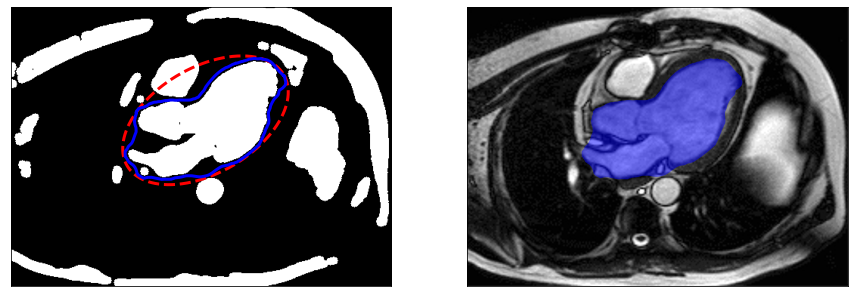

In [32]:
# Define the (x, y) coordinates of the points for initialization
s = np.linspace(0, 2*np.pi, 600)
r = 150 + 70*np.sin(s)
c = 258 + 120*np.cos(s)
init = np.array([r, c]).T
# Define the rotation angle in radians
angle =- np.pi / 6  # 30 degrees, you can change this angle as needed
# Rotate the initial curve
rotated_init = np.dot(init - np.mean(init, axis=0), [[np.cos(angle), -np.sin(angle)], [np.sin(angle), np.cos(angle)]]) + np.mean(init, axis=0)

semi_auto_snake = active_contour(
    gaussian(binary_opening_image, 3, preserve_range=False), rotated_init, max_px_move=0.4, alpha=0.1, beta=10, w_line=-5, w_edge=8,
                                                                convergence = 0.15, gamma=0.001)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 12)) 

ax1.imshow(binary_opening_image, cmap=plt.cm.gray)
ax1.plot(rotated_init[:, 1], rotated_init[:, 0], '--r', lw=3)
ax1.plot(semi_auto_snake[:, 1], semi_auto_snake[:, 0], '-b', lw=3)
ax1.set_xticks([]), ax1.set_yticks([])
ax1.axis([0, binary_opening_image.shape[1], binary_opening_image.shape[0], 0])

ax2.imshow(heart, cmap=plt.cm.gray)
ax2.fill(semi_auto_snake[:, 1], semi_auto_snake[:, 0], 'b', alpha=0.5)
ax2.set_xticks([]), ax2.set_yticks([])
ax2.axis([0, heart.shape[1], heart.shape[0], 0])

plt.show()

By using an angled ellipse as initialization curve two things can be observed:
   - 1) The algorithm does a much better job at fitting the initial contour to the edges of the ROI when they are smoother
   - 2) The algorithm performs worse when it has to fit the initialized curved to regions with complex splines and other structures in the middle of said splines. In this aspect providing a manually selected region is a better alternative
   
To recap, we have first seen that applying a manual initialization curve provides the best result yet (although this could be improved), but it strongly depends on the region set by the operator and it is very time consuming and inefficient when segmenting several images. Then we saw that applying background minimization gets rid of elements inside splines and separates other bright elements surrounding the ROI. It also assists the algorithmm in the minimization of the energy, since the pixel gradient is greater at the ROI and it is easier for it to adjust to its edges and shape. Finally we saw that by applying a semi-automatic method for the initialization curve, even though  faster process, the algorithm is affected by surrounding structures and it is not able to deform the initial curve to fit deep and sharp splines.

With these conclusions we have decided to implement all the methods at once, in conjunction with **region growing**, to obtain the benefits that each provide and compensate for their individual weaknesses. This process will basically consist of using the segmentation obtained from the region growing algorithm as the contour for the initialization of the active contour algorithm. To the segmentation obtained with region growing we have applied the closing operation (dilation + erosion) and an additional dilation to have a margin over the actual ROI. From the resulting image we have retrieved the edge of the region to segment and applied that edge to the active contour algorithm as initialization curve. This solution provides an automatic and precise way of defining the initalization curve, that will later be deformed to fit the ROI.

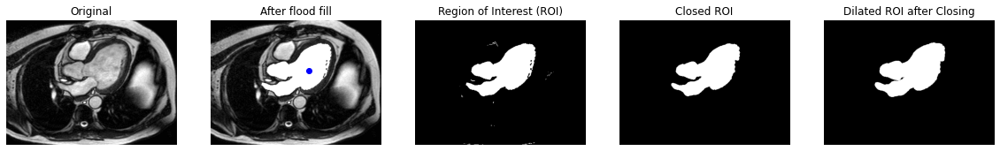

In [33]:
from skimage.morphology import binary_dilation, disk
import matplotlib.pyplot as plt

# Perform flood fill to get the ROI
roi = flood_fill(heart, (150, 290), 255, tolerance=85, connectivity=1)

# Create a binary mask for the ROI
roi_mask = (roi == 255).astype(int)

# Apply the binary mask to the original image to get the ROI
roi_image = heart * roi_mask

# Define the structuring element (e.g., a disk) and its size and apply the morphological closing operation
selem_op = morphology.disk(5)
closed_image = morphology.opening(roi_mask, selem_op)

# Dilate the ROI
selem_di = np.ones((5, 5)) 
dilated_roi = binary_dilation(closed_image, selem=selem_di)

fig, ax = plt.subplots(ncols=5, figsize=(20, 20))

ax[0].imshow(heart, cmap=plt.cm.gray)
ax[0].set_title('Original')
ax[0].axis('off')

ax[1].imshow(roi, cmap=plt.cm.gray)
ax[1].plot(290, 150, 'bo')  # seed point
ax[1].set_title('After flood fill')
ax[1].axis('off')

ax[2].imshow(roi_mask, cmap=plt.cm.gray)
ax[2].set_title('Region of Interest (ROI)')
ax[2].axis('off')

ax[3].imshow(closed_image, cmap=plt.cm.gray)
ax[3].set_title('Closed ROI')
ax[3].axis('off')

ax[4].imshow(dilated_roi, cmap=plt.cm.gray)
ax[4].set_title('Dilated ROI after Closing')
ax[4].axis('off')

plt.show()


Now we obtain the points that make up the edges of the 'Dilated image of the ROI¡ after applying a closing morphological operation. We do this by using a mask that detects the edges of the ROI and keeps their pixel value while making the pixels inside the edge black (0). Then the points are connected because the active contours algorithm expects a continuous curve as an initial contour. If the contour points are not connected, it can lead to issues when using them as an initialization.

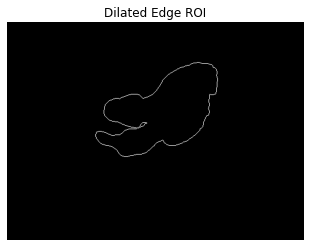

In [34]:
from skimage.morphology import binary_erosion
import numpy as np
from skimage.measure import find_contours

# Create a binary mask of the contour using erosion
contour_mask = np.logical_xor(dilated_roi, binary_erosion(dilated_roi, selem=None))
contour_overlay = np.where(dilated_roi, 255, 0)  # White for contour, black for inner pixels
contour_points = np.argwhere(contour_overlay == 255)

plt.imshow(contour_mask, cmap = plt.cm.gray)
plt.title('Dilated Edge ROI')
plt.axis('off')

# Connect contour points
contours = find_contours(contour_overlay, 0.5)  # Find continuous contours
if len(contours) > 0:
    # Select the longest continuous contour (assuming it's the object's boundary)
    contour = max(contours, key=len)

    # Convert the coordinates to integers
    contour_points = contour.astype(int)
else:
    # Handle the case when no contour is found
    contour_points = np.array([])

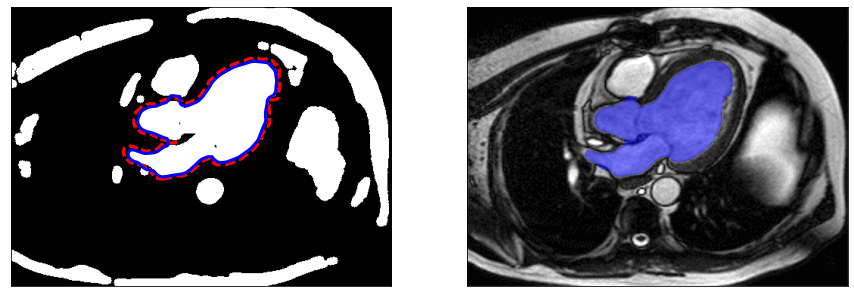

In [35]:
init_points = contour_points

final_snake = active_contour(
    gaussian(binary_opening_image, 3, preserve_range=False), init_points)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 15)) 

ax1.imshow(binary_opening_image, cmap=plt.cm.gray)
ax1.plot(init_points[:, 1], init_points[:, 0], '--r', lw=3)
ax1.plot(final_snake[:, 1], final_snake[:, 0], '-b', lw=3)
ax1.set_xticks([]), ax1.set_yticks([])
ax1.axis([0, heart.shape[1], heart.shape[0], 0])

ax2.imshow(heart, cmap=plt.cm.gray)
ax2.fill(final_snake[:, 1], final_snake[:, 0], 'b', alpha=0.5)
ax2.set_xticks([]), ax2.set_yticks([])
ax2.axis([0, heart.shape[1], heart.shape[0], 0])

plt.show()

By implementing the two segmentation techniques together we are able to obtain the best segmentation result in this section, better than the results we would obtain by applying the techniques individually. It is also worth mentioning that the segmented region is obtained with the default argument values of the active contour function and no parameter tuning was required which makes the implementation of the algorithm more time efficient.

For the brain MRI image, we want to segment the tumor on the right-hand side, which is a simpler and smoother region to segment and with brighter pixels than surrounding regions (this makes sense because tumors have increased cell density and hence higher proton density) which favors an effective performance of the algorithm. We conclude that with a simple initilization curve, such as the circle, placed on the tumorous region, the algorithm will do an acceptable segmentation (semi-automatic initialization). However, because the tumor is located on the edge of the brain, we will have to account for the bright edge corresponding to the bone tissue of the skull, since this will affect the  fitting of the contour (fits to high gradient pixels). To do this we will once again apply Background Minimization.

As it can be seen the resulting background eliminated image will be one without the borders from the skull and with blurriness. This blurriness will not affect the algorithm, it fact it will be helpful for it since it get rids of gradient differences due to noise.

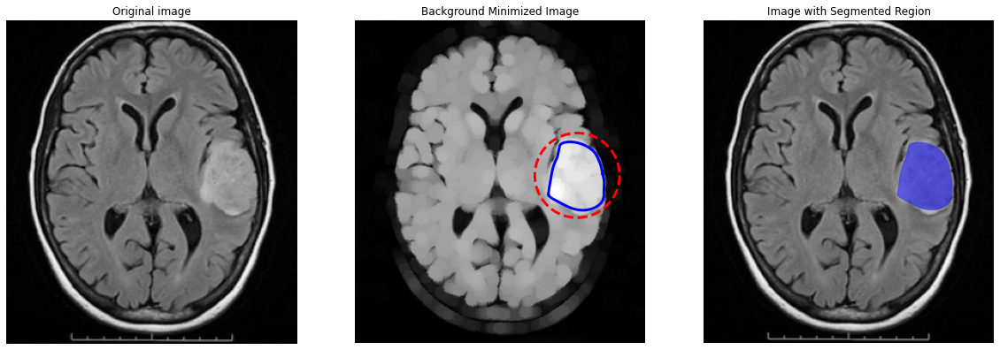

In [36]:
# Define the (x, y) coordinates of the points for initialization

selem_op = morphology.disk(5)
opened_image_brain = morphology.opening(brain, selem_op)

s = np.linspace(0, 2*np.pi, 600)
r = 150 + 41*np.sin(s)
c = 215 + 41*np.cos(s)
init = np.array([r, c]).T

# Algorithm applied over with backgorund minimized by opening operation
snake_brain = active_contour(
    gaussian(opened_image_brain, 3, preserve_range=False), init, w_line=0.14, beta=10, alpha=0.01, gamma=0.01, convergence=0.13)

fig, ax = plt.subplots(ncols=3, figsize=(20, 20))

ax[0].imshow(brain, cmap=plt.cm.gray)
ax[0].set_title('Original image')
ax[0].axis('off')

ax[1].imshow(opened_image_brain, cmap=plt.cm.gray)
ax[1].set_title('Background Minimized Image')
ax[1].plot(init[:, 1], init[:, 0], '--r', lw=3)
ax[1].plot(snake_brain[:, 1], snake_brain[:, 0], '-b', lw=3)
ax[1].set_xticks([])  
ax[1].set_yticks([])  
ax[1].axis([0, brain.shape[1], brain.shape[0], 0])
ax[1].axis('off')

ax[2].imshow(brain, cmap=plt.cm.gray)
ax[2].set_title('Image with Segmented Region')
ax[2].fill(snake_brain[:, 1], snake_brain[:, 0], 'b', alpha=0.5)
ax[2].set_xticks([])  
ax[2].set_yticks([])  
ax[2].axis([0, brain.shape[1], brain.shape[0], 0])
ax[2].axis('off')

plt.show()

As expected from previous results the segmented region obtained with background minimization and a semi-automatic initialization curve is very satisfactory, without the need of extremely complex initial curves or intensive paramater tuning.

## Advanced Segmentation Technique: Felzenszwalb

**Felzenszwalb Segmentation:** The Felzenszwalb segmentation algorithm aims to partition an image into meaningful regions by detecting abrupt changes in pixel intensity values. This technique is used to delineate objects or regions of interest within the image.

**Key Concepts:**

1. **Similarity-Based Segmentation:** The Felzenszwalb method operates on the principle that pixels with similar intensity values are likely to belong to the same region. It identifies these regions by considering intensity differences between neighboring pixels.

2. **Scale Parameter (`scale`):** One of the central components of the algorithm is the scale parameter. This parameter governs the trade-off between the size and regularity of segments. Smaller values produce more irregularly shaped and smaller segments, while larger values yield smoother and larger regions. Choosing an appropriate scale is crucial for achieving the desired segmentation result.

3. **Gaussian Smoothing (`sigma`):** Before segmentation, the image is smoothed using Gaussian filtering with the `sigma` parameter. Smoothing helps reduce sensitivity to noise and minor intensity fluctuations, leading to more robust segmentation results.

4. **Minimum Segment Size (`min_size`):** The algorithm incorporates a `min_size` parameter, which defines the minimum number of pixels that a region must contain. Smaller regions are merged into neighboring regions to maintain a meaningful segmentation. This parameter can influence the level of detail in the segmentation.

**Advantages:**

- **Scale Flexibility:** The Felzenszwalb algorithm can capture regions of various sizes and shapes, which makes it adaptable to diverse images with objects of different scales.

- **Automated Segmentation:** The algorithm doesn't rely on user-provided seeds or thresholds. It can operate autonomously, which is particularly advantageous for large datasets.

- **Broad Applicability:** The method is applicable to a wide range of image types, including medical images, where it can be used to segment anatomical structures or regions of interest.

**Disadvantages:**

- **Segmentation Sensitivity:** The choice of scale and sigma parameters significantly influences the segmentation result. Finding the optimal parameter values can be challenging and may require experimentation.

- **Shape Variability:** When using smaller scale values, the algorithm can produce irregularly shaped segments, which might not be suitable for all applications.

- **Sensitivity to Image Conditions:** The algorithm may still be sensitive to variations in image acquisition conditions, such as lighting and contrast.

First of all, the function 'visualize_felzenszwalb_segmentation' is implemented for displaying the segmented image with different scale values.

In [37]:
def visualize_felzenszwalb(img, option):
    """ Visualizes the results of Felzenszwalb image segmentation with different 'k' values.

    Parameters:
    - img (numpy.ndarray): The input image to be segmented using the Felzenszwalb algorithm.
    - option (integer): The option chosen by the user. 1 or 2.
      - 1: Apply Felzenszwalb segmentation for each 'k' value
      - 2: Apply Felzenszwalb segmentation and plot boundaries for each 'k' value
      
    Outputs:
    - Display of segmented images with varying 'k' values, allowing users to observe the effects 
    of different 'k' values on image segmentation results. It gives two possible options, seeing
    the original felzenszwalb segmentation or the boundaries computed by the technique.
    """

    # Define a range of 'k' values from 50 to 1000 in steps of 50
    k_values = range(50, 1001, 50)

    # Calculate the number of rows needed
    num_rows = len(k_values) // 5 + (len(k_values) % 5 > 0)

    # Create subplots for each 'k' value in rows of 5
    fig, axes = plt.subplots(num_rows, 5, figsize=(15, 3 * num_rows))

    # Iterate over the 
    for i, k in enumerate(k_values):
        row, col = divmod(i, 5)
        segmented_image = felzenszwalb(img, scale=k)
        ax = axes[row, col]
        # if-elif-else body for seeing the option chosen by the user
        if option == 1:
            # Apply Felzenszwalb segmentation for each 'k' value
            ax.imshow(segmented_image)
        elif option == 2:
            # Apply Felzenszwalb segmentation and plot boundaries for each 'k' value
            ax.imshow(mark_boundaries(img, segmented_image))
        else:
            print('Choose an option between 1 and 2. Please check.')
        ax.set_xlabel(f"k={k}")
        ax.set_title("Segmentation")

    # Remove any empty subplots if the last row is not completely filled
    if len(k_values) % 5 > 0:
        for j in range(len(k_values) % 5, 5):
            fig.delaxes(axes[num_rows - 1, j])

    plt.suptitle("Graph-based Image Segmentation with Different k Values")
    plt.tight_layout()
    plt.show()

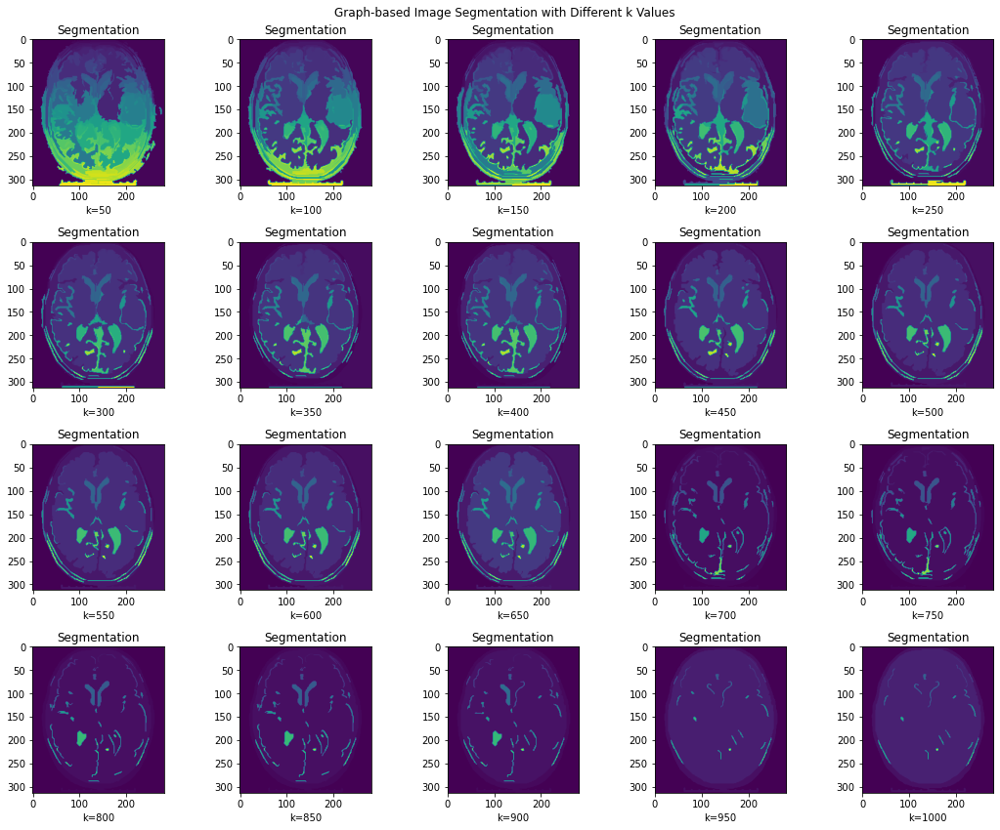

In [38]:
# Visualize the Felzenszwalb Segmentation Technique for different scale values for the brain MRI image
visualize_felzenszwalb(brain, 1)

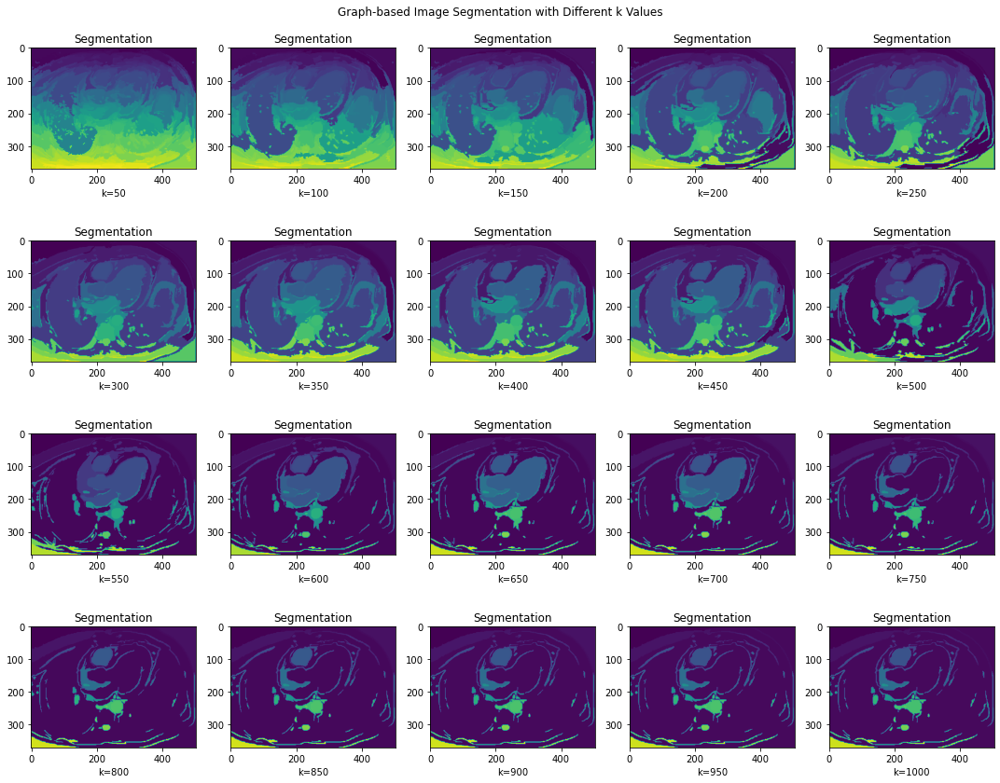

In [39]:
# Visualize the Felzenszwalb Segmentation Technique for different scale values for the heart MRI image
visualize_felzenszwalb(heart, 1)

Now, the segmentation boundaries for different scale values can be seen selecting option 2.

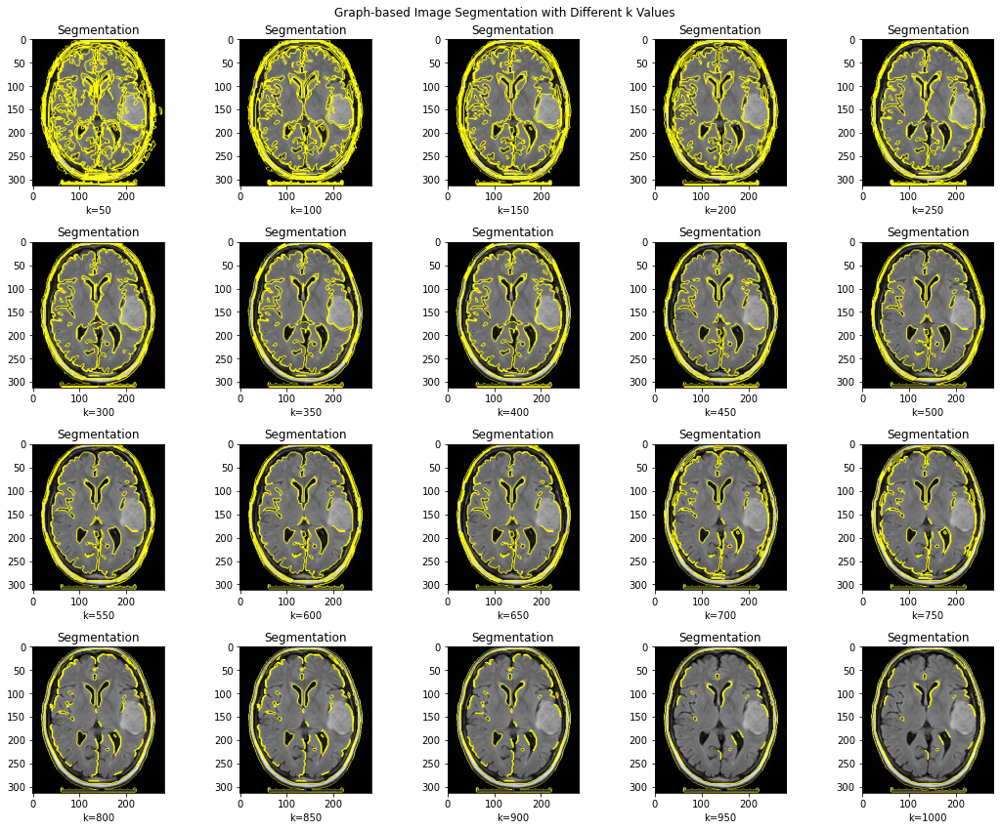

In [40]:
# Visualize the Segmentation Boundaries Technique for different scale values for the brain MRI image
visualize_felzenszwalb(brain, 2)

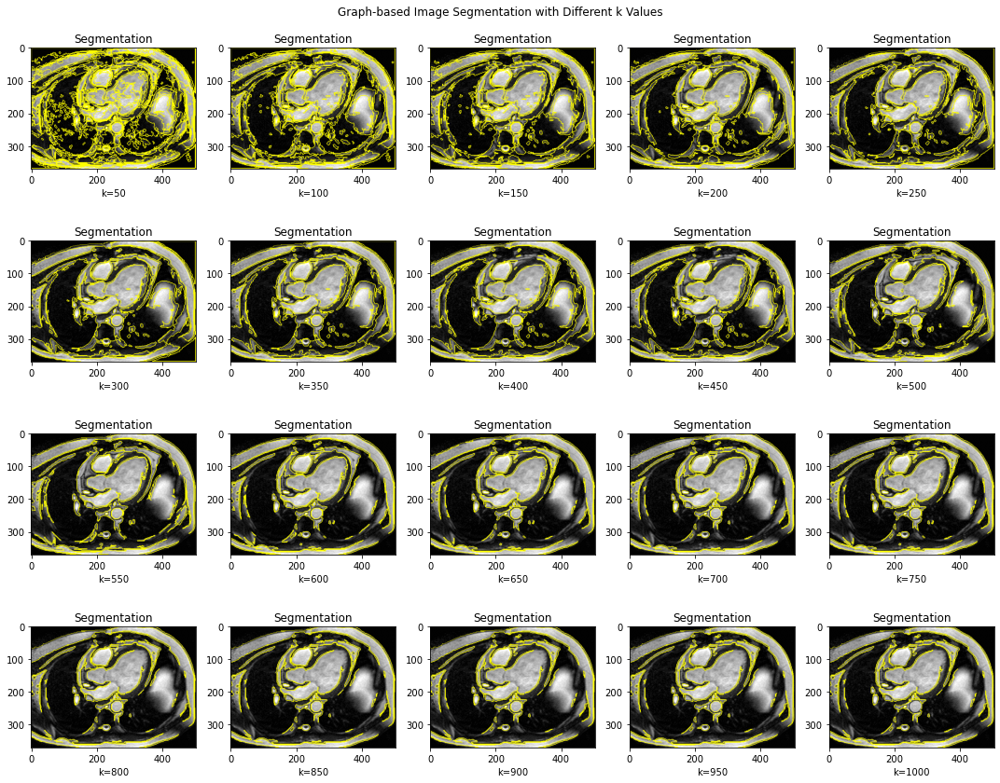

In [41]:
# Visualize the Segmentation Boundaries Technique for different scale values for the heart MRI image
visualize_felzenszwalb(heart, 2)

However, this segmentation technique is not able to segment the ROI estbablished at the beginning of the project for each image (tumor for the brain MRI and the ventricles for the heart MRI), although it seems that for k=150 and option = 1 the result for the brain MRI seem to be decent. 

Nonetheless, when computing the boundaries with option = 2, it is seen that there exist some discontinuities for the computed edges, having the possibility to improve the implementation of this technique.

Thus, in order to improve the implementation of the Felzenszwalb algorithm, a mask similar to the one implemented in the contour tracking section is used, enabling a better segmentation.

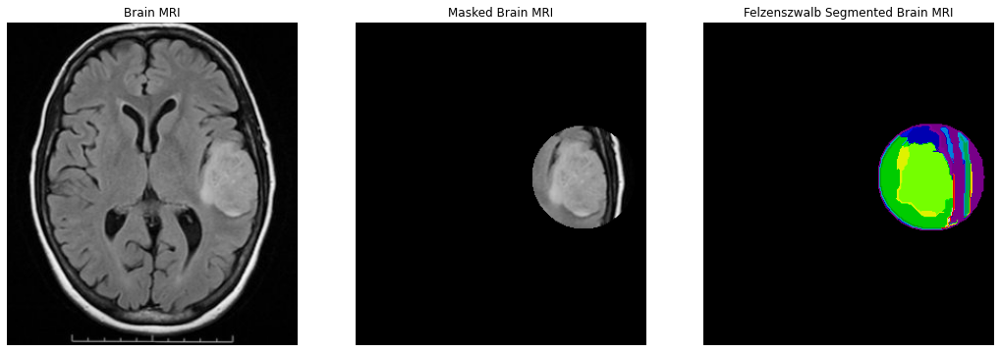

In [42]:
# Define the contour as a series of coordinates (r, c)
s = np.linspace(0, 2 * np.pi, 600)
r = 150 + 50 * np.sin(s)  # Radial coordinates
c = 220 + 50 * np.cos(s)  # Circular coordinates
init = np.array([r, c]).T  # Create a matrix of coordinates (r, c)

# Create a mask for the contour
rr, cc = polygon(r, c)  # Get the coordinates of pixels inside the contour
mask = np.zeros(brain.shape, dtype=bool)  # Create a mask of zeros with the same size as the image
mask[rr, cc] = True  # Set the mask to True for pixels inside the contour

# Set the pixels outside the contour to black
masked_image_brain = brain.copy()
masked_image_brain[~mask] = 0  # Assign zeros to pixels outside the contour in the "brain" image

# Apply the Felzenszwalb algorithm only in the region limited by the mask
segments_brain = felzenszwalb(masked_image_brain, scale=195, sigma=0.8, min_size=20)

# Create a figure for visualization
fig = plt.figure(figsize=(18, 12))

# First subplot: Brain MRI image
plt.subplot(1, 3, 1)
plt.imshow(brain, cmap=plt.cm.gray)
plt.title('Brain MRI')
plt.axis('off')

# Second subplot: Masked image
plt.subplot(1, 3, 2)
plt.imshow(masked_image_brain, cmap=plt.cm.gray)
plt.title('Masked Brain MRI')
plt.axis('off')

# Second subplot: Segmented image
plt.subplot(1, 3, 3)
plt.imshow(segments_brain, cmap='nipy_spectral')
plt.title('Felzenszwalb Segmented Brain MRI')
plt.axis('off')

plt.show()  # Show the figure

Also, another preprocessing tecniques such as applying a median filter can be implemented in order to try to improve the results.

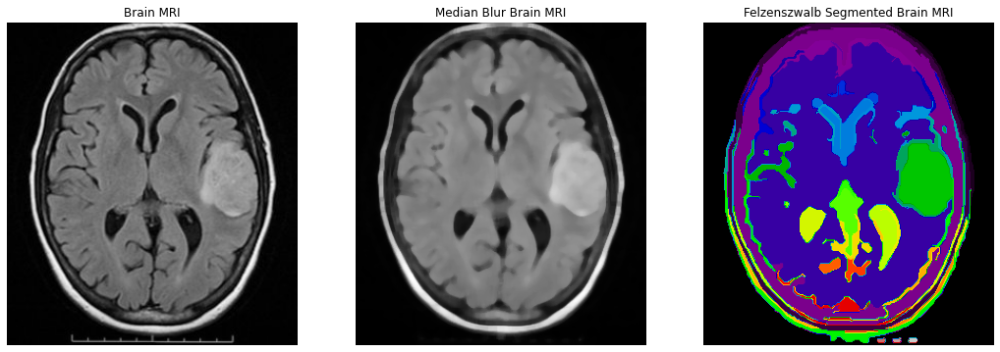

In [43]:
blur = cv.medianBlur(brain, 7)

# Apply the Felzenszwalb algorithm only in the region limited by the mask
segments_brain_blur = felzenszwalb(blur, scale=180, sigma=0.8, min_size=20)

# Create a figure for visualization
fig = plt.figure(figsize=(18, 12))

# First subplot: Brain MRI image
plt.subplot(1, 3, 1)
plt.imshow(brain, cmap=plt.cm.gray)
plt.title('Brain MRI')
plt.axis('off')

# Second subplot: Masked image
plt.subplot(1, 3, 2)
plt.imshow(blur, cmap=plt.cm.gray)
plt.title('Median Blur Brain MRI')
plt.axis('off')

# Second subplot: Segmented image
plt.subplot(1, 3, 3)
plt.imshow(segments_brain_blur, cmap='nipy_spectral')
plt.title('Felzenszwalb Segmented Brain MRI')
plt.axis('off')

plt.show()  # Show the figure

The same procedure is applied for the heart MRI, but without having the results as the ones taken with the brain MRI.

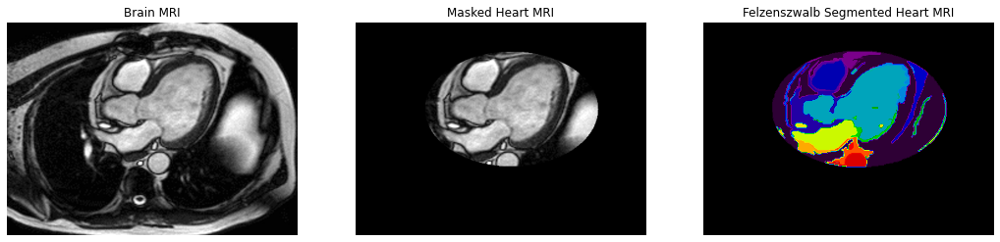

In [44]:
# Define the contour as a series of coordinates (r, c)
s = np.linspace(0, 2 * np.pi, 600)
r = 150 + 100 * np.sin(s) # Radial coordinates
c = 270 + 150 * np.cos(s) # Circular coordinates
init = np.array([r, c]).T # Create a matrix of coordinates (r, c)

# Create a mask for the contour
rr, cc = polygon(r, c)  # Get the coordinates of pixels inside the contour
mask = np.zeros(heart.shape, dtype=bool)  # Create a mask of zeros with the same size as the image
mask[rr, cc] = True  # Set the mask to True for pixels inside the contour

# Set pixels outside the contour to black
masked_image_heart = heart.copy()
masked_image_heart[~mask] = 0   # Assign zeros to pixels outside the contour in the "heart" image

# Apply the Felzenszwalb algorithm only in the region defined by the mask
segments_heart = felzenszwalb(masked_image_heart, scale=300, sigma=0.8, min_size=20)

# Create a figure for visualization
fig = plt.figure(figsize=(18, 12))

# First subplot: Heart MRI image
plt.subplot(1, 3, 1)
plt.imshow(heart, cmap=plt.cm.gray)
plt.title('Brain MRI')  # Title of the image
plt.axis('off')  # Turn off the axes

# Second subplot: Masked image
plt.subplot(1, 3, 2)
plt.imshow(masked_image_heart, cmap=plt.cm.gray)
plt.title('Masked Heart MRI')
plt.axis('off')

# Third subplot: Segmented image
plt.subplot(1, 3, 3)
plt.imshow(segments_heart, cmap='nipy_spectral')
plt.title('Felzenszwalb Segmented Heart MRI')
plt.axis('off')
plt.show()

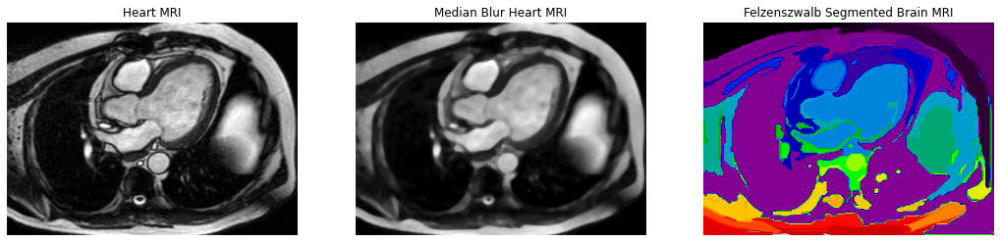

In [45]:
blur = cv.medianBlur(heart, 9)

# Apply the Felzenszwalb algorithm only in the region limited by the mask
segments_brain_blur = felzenszwalb(blur, scale=185, sigma=0.8, min_size=20)

# Create a figure for visualization
fig = plt.figure(figsize=(18, 12))

# First subplot: Brain MRI image
plt.subplot(1, 3, 1)
plt.imshow(heart, cmap=plt.cm.gray)
plt.title('Heart MRI')
plt.axis('off')

# Second subplot: Masked image
plt.subplot(1, 3, 2)
plt.imshow(blur, cmap=plt.cm.gray)
plt.title('Median Blur Heart MRI')
plt.axis('off')

# Second subplot: Segmented image
plt.subplot(1, 3, 3)
plt.imshow(segments_brain_blur, cmap='nipy_spectral')
plt.title('Felzenszwalb Segmented Brain MRI')
plt.axis('off')

plt.show()  # Show the figure

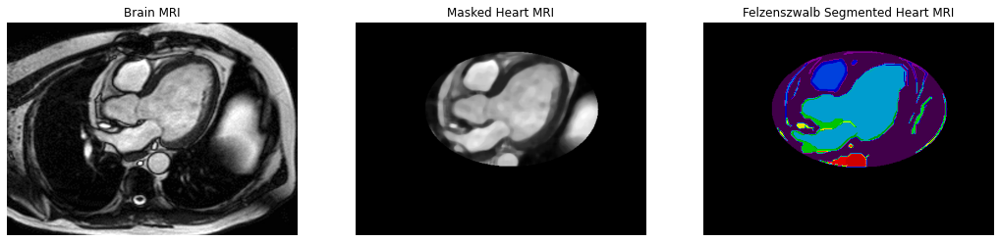

In [46]:
# Applying both, a median filter and a mask to the heart MRI
# Define the contour as a series of coordinates (r, c)
s = np.linspace(0, 2 * np.pi, 600)
r = 150 + 100 * np.sin(s) # Radial coordinates
c = 270 + 150 * np.cos(s) # Circular coordinates
init = np.array([r, c]).T # Create a matrix of coordinates (r, c)

# Create a mask for the contour
rr, cc = polygon(r, c)  # Get the coordinates of pixels inside the contour
mask = np.zeros(blur.shape, dtype=bool)  # Create a mask of zeros with the same size as the image
mask[rr, cc] = True  # Set the mask to True for pixels inside the contour

# Set pixels outside the contour to black
masked_image_heart = blur.copy()
masked_image_heart[~mask] = 0   # Assign zeros to pixels outside the contour in the "heart" image

# Apply the Felzenszwalb algorithm only in the region defined by the mask
segments_heart = felzenszwalb(masked_image_heart, scale=300, sigma=0.8, min_size=20)

# Create a figure for visualization
fig = plt.figure(figsize=(18, 12))

# First subplot: Heart MRI image
plt.subplot(1, 3, 1)
plt.imshow(heart, cmap=plt.cm.gray)
plt.title('Brain MRI')  # Title of the image
plt.axis('off')  # Turn off the axes

# Second subplot: Masked image
plt.subplot(1, 3, 2)
plt.imshow(masked_image_heart, cmap=plt.cm.gray)
plt.title('Masked Heart MRI')
plt.axis('off')

# Third subplot: Segmented image
plt.subplot(1, 3, 3)
plt.imshow(segments_heart, cmap='nipy_spectral')
plt.title('Felzenszwalb Segmented Heart MRI')
plt.axis('off')
plt.show()